# Telecom Churn Prediction - Notebook

**Author:** Harshdeep Singh and Hannah Abraham

# 0. Problem statement

In the telecom industry, customers are able to choose from multiple service providers and actively switch from one operator to another. In this highly competitive market, the telecommunications industry experiences an average of 15-25% annual churn rate. Given the fact that it costs 5-10 times more to acquire a new customer than to retain an existing one, customer retention has now become even more important than customer acquisition.

For many incumbent operators, retaining high profitable customers is the number one business
goal. To reduce customer churn, telecom companies need to predict which customers are at high risk of churn. In this project, you will analyze customer-level data of a leading telecom firm, build predictive models to identify customers at high risk of churn, and identify the main indicators of churn.

In this competition, your goal is *to build a machine learning model that is able to predict churning customers based on the features provided for their usage.*

**Customer behaviour during churn:**

Customers usually do not decide to switch to another competitor instantly, but rather over a
period of time (this is especially applicable to high-value customers). In churn prediction, we
assume that there are three phases of customer lifecycle :

1. <u>The ‘good’ phase:</u> In this phase, the customer is happy with the service and behaves as usual.

2. <u>The ‘action’ phase:</u> The customer experience starts to sore in this phase, for e.g. he/she gets a compelling offer from a competitor, faces unjust charges, becomes unhappy with service quality etc. In this phase, the customer usually shows different behaviour than the ‘good’ months. It is crucial to identify high-churn-risk customers in this phase, since some corrective actions can be taken at this point (such as matching the competitor’s offer/improving the service quality etc.)

3. <u>The ‘churn’ phase:</u> In this phase, the customer is said to have churned. In this case, since you are working over a four-month window, the first two months are the ‘good’ phase, the third month is the ‘action’ phase, while the fourth month (September) is the ‘churn’ phase.

# 1. Loading dependencies & datasets

In [68]:
# Installing Required Libraries
!pip install missingno
!pip install statsmodels
!pip install imbalanced-learn
!pip install xgboost


[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip

[notice] A new release of pip is available: 23.0.1 -> 24.2
[notice] To update, run: pip install --upgrade pip


In [69]:
# Numerical and Data Analysis Library
import pandas as pd
import numpy as np
from datetime import datetime
import math

# Regex Search
import re

# Missingno Library
import missingno as msno

# MICE Imputation Library
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer

# Sklearn - Machine Learning Library
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA, IncrementalPCA

from sklearn.linear_model import LogisticRegression
from sklearn.pipeline import Pipeline 
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, precision_recall_curve, roc_curve , auc,classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from sklearn.ensemble import AdaBoostClassifier
from sklearn.feature_selection import RFE
import statsmodels.api as sm
from sklearn.utils.class_weight import compute_class_weight

# Handle Imbalance Library
from imblearn.over_sampling import SMOTE

# XGboost Library
import xgboost as xgb
from xgboost import XGBClassifier

# Plotting
import matplotlib.pyplot as plt
import seaborn as sns

# Extra - To Suppress Warnings
import warnings
warnings.filterwarnings('ignore')

# Rendering plot below cell
%matplotlib inline

In [70]:
# Setting Display Options

# Setting display limit of dataframe
pd.set_option('display.max_columns', 300)
pd.set_option('display.max_rows', 300)
pd.set_option('display.max_colwidth', 1000)

In [71]:
# Reading the datasets
train = pd.read_csv("/kaggle/input/churndata/train.csv")
test = pd.read_csv("/kaggle/input/churndata/test.csv")
sample = pd.read_csv("/kaggle/input/churndata/sample.csv")
data_dict = pd.read_csv("/kaggle/input/churndata/data_dictionary.csv")

In [72]:
# Printing the shapes of the datasets
print("Shape of the train dataset : ", train.shape)
print("Shape of the test dataset : ", test.shape)
print("Shape of the sample dataset : ", sample.shape)
print("Shape of the data dictionary dataset : ", data_dict.shape)

Shape of the train dataset :  (69999, 172)
Shape of the test dataset :  (30000, 171)
Shape of the sample dataset :  (30000, 2)
Shape of the data dictionary dataset :  (36, 2)


In [73]:
# Analyzing the data dicitonary
data_dict

,Acronyms,Description
0,CIRCLE_ID,Telecom circle area to which the customer belongs to
1,LOC,Local calls within same telecom circle
2,STD,STD calls outside the calling circle
3,IC,Incoming calls
4,OG,Outgoing calls
5,T2T,Operator T to T ie within same operator mobile to mobile
6,T2M,Operator T to other operator mobile
7,T2O,Operator T to other operator fixed line
8,T2F,Operator T to fixed lines of T
9,T2C,Operator T to its own call center


In [74]:
# Printing the first five rows of the train dataset
train.head()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
0,0,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,31.277,87.009,7.527,48.58,124.38,1.29,32.24,96.68,2.33,0.00,0.0,0.0,0.00,0.0,0.00,2.23,0.00,0.28,5.29,16.04,2.33,0.00,0.00,0.00,0.00,0.00,0.00,7.53,16.04,2.61,46.34,124.38,1.01,18.75,80.61,0.0,0.00,0.0,0.0,0.0,0.0,0.0,65.09,204.99,1.01,0.0,0.0,0.0,8.20,0.63,0.00,0.38,0.0,0.0,81.21,221.68,3.63,2.43,3.68,7.79,0.83,21.08,16.91,0.00,0.00,0.00,3.26,24.76,24.71,0.00,7.61,0.21,7.46,19.96,14.96,0.0,0.0,0.0,0.0,0.0,0.0,7.46,27.58,15.18,11.84,53.04,40.56,0.0,0.0,0.66,0.0,0.0,0.0,1.11,0.69,0.00,3,2,2,77,65,10,65,65,10,6/22/2014,7/10/2014,8/24/2014,65,65,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.00,0.00,0.0,0.00,0.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0,0,0,0,0,0,0,0,0,0,0,0,NaN,NaN,NaN,1958,0.0,0.0,0.0,0
1,1,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,0.000,122.787,42.953,0.00,0.00,0.00,0.00,25.99,30.89,0.00,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,22.01,29.79,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,0.0,0.0,0.0,0.00,30.73,31.66,0.00,0.0,0.0,0.00,30.73,31.66,1.68,19.09,10.53,1.41,18.68,11.09,0.35,1.66,3.40,3.44,39.44,25.03,0.00,0.00,0.00,0.00,0.00,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,3.44,39.44,25.04,0.0,0.0,0.01,0.0,0.0,0.0,0.00,0.00,0.00,3,4,5,0,145,50,0,145,50,6/12/2014,7/10/2014,8/26/2014,0,0,0,NaN,7/8/2014,NaN,NaN,1.0,NaN,NaN,145.0,NaN,NaN,0.0,NaN,NaN,1.0,NaN,Na

In [75]:
# Printing the last five rows of the train dataset
train.tail()

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
69994,69994,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,15.760,410.924,329.136,0.00,7.36,10.93,0.00,488.46,381.64,14.96,0.0,0.0,0.00,0.0,0.0,0.00,2.44,7.19,0.00,60.64,89.66,0.00,0.00,0.00,0.0,2.43,0.86,0.00,63.09,96.86,0.00,4.91,3.73,0.00,414.61,290.14,0.0,0.0,0.0,0.0,0.0,0.0,0.00,419.53,293.88,0.00,0.0,0.0,0.00,14.05,1.83,0.0,0.0,0.0,0.00,496.68,392.58,0.00,26.59,33.84,0.00,172.33,223.91,0.00,1.06,0.00,0.00,199.99,257.76,0.00,0.00,0.00,0.00,21.99,11.79,0.0,0.0,0.00,0.0,0.0,0.0,0.00,21.99,11.79,0.00,221.99,269.56,0.0,0.0,0.0,0.00,0.0,0.00,0.00,0.00,0.00,1,17,13,50,397,512,50,110,130,6/18/2014,7/31/2014,8/31/2014,50,20,130,NaN,7/31/2014,8/21/2014,NaN,7.0,1.0,NaN,25.0,17.0,NaN,6.0,1.0,NaN,1.0,0.0,NaN,135.0,17.0,0.00,244.59,144.31,0.00,0.00,0.00,NaN,21.91,0.00,NaN,60.61,48.00,NaN,0.0,0.0,0,0,0,0,6,1,0,0,0,0,1,0,NaN,1.0,1.0,221,0.00,0.00,0.00,0
69995,69995,109,0.0,0.0,0.0,6/30/2014,7/31/2014,8/31/2014,160.083,289.129,265.772,116.54,196.46,232.63,49.53,96.28,48.06,0.00,0.0,0.0,0.00,0.0,0.0,7.18,30.11,9.06,37.53,73.84,47.34,2.01,0.00,0.00,0.0,4.01,0.00,46.73,103.96,56.41,109.36,166.34,223.56,9.98,18.41,0.53,0.0,0.0,0.0,0.0,0.0,0.0,119.34,184.76,224.09,0.00,0.0,0.0,0.13,4.01,0.18,0.0,0.0,0.0,166.21,292.74,280.69,30.48,28.48,23.09,21.78,35.18,28.79,2.38,0.21,0.00,54.64,63.88,51.89,16.63,39.23,66.28,8.96,9.31,17.24,0.0,0.0,0.00,0.0,0.0,0.0,25.59,48.54,83.53,80.24,112.43,136.01,0.0,0.0,0.5,0.00,0.0,0.00,0.00,0.00,0.08,5,11,9,200,31

In [76]:
# Printing the information of the train dataset
train.info(verbose=1)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 69999 entries, 0 to 69998
Data columns (total 172 columns):
 #    Column                    Dtype  
---   ------                    -----  
 0    id                        int64  
 1    circle_id                 int64  
 2    loc_og_t2o_mou            float64
 3    std_og_t2o_mou            float64
 4    loc_ic_t2o_mou            float64
 5    last_date_of_month_6      object 
 6    last_date_of_month_7      object 
 7    last_date_of_month_8      object 
 8    arpu_6                    float64
 9    arpu_7                    float64
 10   arpu_8                    float64
 11   onnet_mou_6               float64
 12   onnet_mou_7               float64
 13   onnet_mou_8               float64
 14   offnet_mou_6              float64
 15   offnet_mou_7              float64
 16   offnet_mou_8              float64
 17   roam_ic_mou_6             float64
 18   roam_ic_mou_7             float64
 19   roam_ic_mou_8             float64
 20   roam

In [77]:
# Printing the statistical summary of the train dataset
train.describe(include="all")

,id,circle_id,loc_og_t2o_mou,std_og_t2o_mou,loc_ic_t2o_mou,last_date_of_month_6,last_date_of_month_7,last_date_of_month_8,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_t2c_mou_6,std_og_t2c_mou_7,std_og_t2c_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_t2o_mou_6,std_ic_t2o_mou_7,std_ic_t2o_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,date_of_last_rech_6,date_of_last_rech_7,date_of_last_rech_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,date_of_last_rech_data_6,date_of_last_rech_data_7,date_of_last_rech_data_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,night_pck_user_6,night_pck_user_7,night_pck_user_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,fb_user_6,fb_user_7,fb_user_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability
count,69999.000000,69999.0,69297.0,69297.0,69297.0,69999,69600,69266,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.0,67312.0,66296.0,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,67231.000000,67312.000000,66296.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,69999.000000,68898,68765,67538,69999.000000,69999.000000

**Observation**:
-  No incorrect rows as headers or footers that need to be deleted.
-  No summary rows as total or subtotal.
-  No missing column names.
-  No inconsistent column names.
-  No dispersed data. All the data in one sheet.

# 2. Data Cleaning

In [78]:
# Checking column wise null percentage
col_null_percentage = pd.DataFrame(100 * train.isnull().mean(), columns =['percentage_missing_values']).sort_values(by="percentage_missing_values")
print(col_null_percentage[col_null_percentage['percentage_missing_values']!=0])

                          percentage_missing_values
last_date_of_month_7                       0.570008
loc_ic_t2o_mou                             1.002871
std_og_t2o_mou                             1.002871
loc_og_t2o_mou                             1.002871
last_date_of_month_8                       1.047158
date_of_last_rech_6                        1.572880
date_of_last_rech_7                        1.762882
date_of_last_rech_8                        3.515765
roam_ic_mou_7                              3.838626
spl_og_mou_7                               3.838626
og_others_7                                3.838626
loc_ic_t2t_mou_7                           3.838626
roam_og_mou_7                              3.838626
loc_og_t2f_mou_7                           3.838626
loc_og_t2c_mou_7                           3.838626
loc_og_mou_7                               3.838626
std_og_t2t_mou_7                           3.838626
std_og_t2m_mou_7                           3.838626
loc_ic_t2m_m

**Observation**:
-  There are multiple categories of data with missing values. We will handle the imputation for each category based on the type of data in the respective columns.

## ARPU Related Columns
Average revenue per user

In [79]:
# Columns with ARPU information
arpu_cols = [col for col in train.columns if re.search('arpu',col)]
print(arpu_cols)

['arpu_6', 'arpu_7', 'arpu_8', 'arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8']


<Axes: >

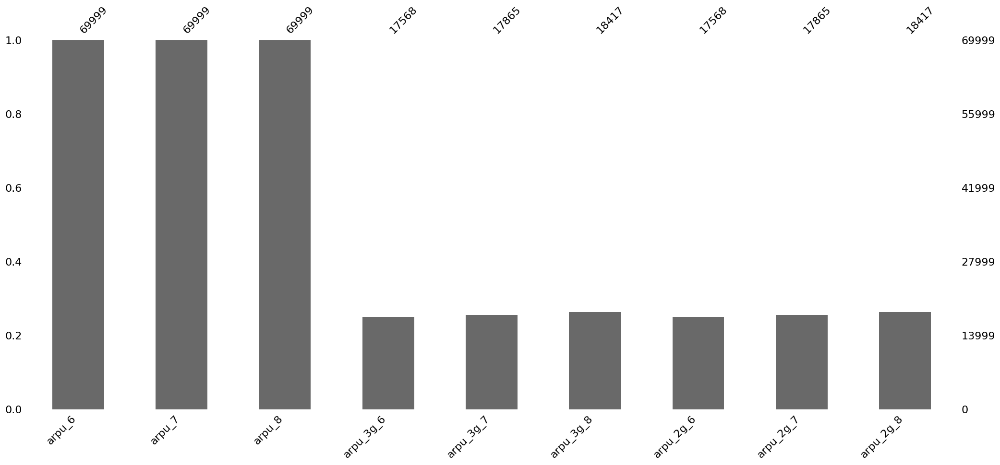

In [80]:
# Visualising the missing columns
msno.bar(train[arpu_cols])

In [81]:
# Calculating the percentage of missing values for ARPU columns
missing_percentage = train[arpu_cols].isnull().mean() * 100

missing_arpu_cols_list = []

# Displaying the results and collecting columns with missing values
for col, percent in missing_percentage.items():
    if percent > 0: 
        missing_arpu_cols_list.append(col)  
        print(f"{col}: {percent:.2f}% missing values")

arpu_3g_6: 74.90% missing values
arpu_3g_7: 74.48% missing values
arpu_3g_8: 73.69% missing values
arpu_2g_6: 74.90% missing values
arpu_2g_7: 74.48% missing values
arpu_2g_8: 73.69% missing values


In [82]:
# Printing the list of arpu related columns having missing values
print(missing_arpu_cols_list)

['arpu_3g_6', 'arpu_3g_7', 'arpu_3g_8', 'arpu_2g_6', 'arpu_2g_7', 'arpu_2g_8']


In [83]:
# Printing the value counts of the missing arpu columns
for col in missing_arpu_cols_list:
    print(f"Value counts for column '{col}':", train[col].value_counts(dropna=False))
    print("\n" + "-"*80 + "\n")

Value counts for column 'arpu_3g_6': arpu_3g_6
NaN        52431
0.00        7617
212.17       501
0.01         317
122.07       295
           ...  
882.14         1
164.10         1
1250.07        1
18.96          1
235.24         1
Name: count, Length: 5507, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'arpu_3g_7': arpu_3g_7
NaN       52134
0.00       7795
212.17      532
0.01        459
122.07      231
          ...  
176.28        1
126.77        1
629.27        1
291.11        1
263.43        1
Name: count, Length: 5390, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'arpu_3g_8': arpu_3g_8
NaN       51582
0.00       7852
212.17      510
0.01        460
122.07      211
          ...  
67.15         1
60.16         1
96.48         1
15.09         1
161.56        1
Name: count, Length: 5817, dtype: int64

---------------------------------

**Observation** 
-  These columns represent the average revenue per user (ARPU) for various services, such as 3G or 2G, during the months of June, July, and August. Missing values may suggest that the user did not generate any revenue during those months, so imputing the missing values with 0 would be appropriate in this context.

In [84]:
# Imputating missing value in missing_arpu_cols_list to 0 
for col in missing_arpu_cols_list:
    train[col].fillna(0, inplace=True)
    test[col].fillna(0, inplace=True)


arpu_3g_6    0
arpu_3g_7    0
arpu_3g_8    0
arpu_2g_6    0
arpu_2g_7    0
arpu_2g_8    0
dtype: int64


<Axes: >

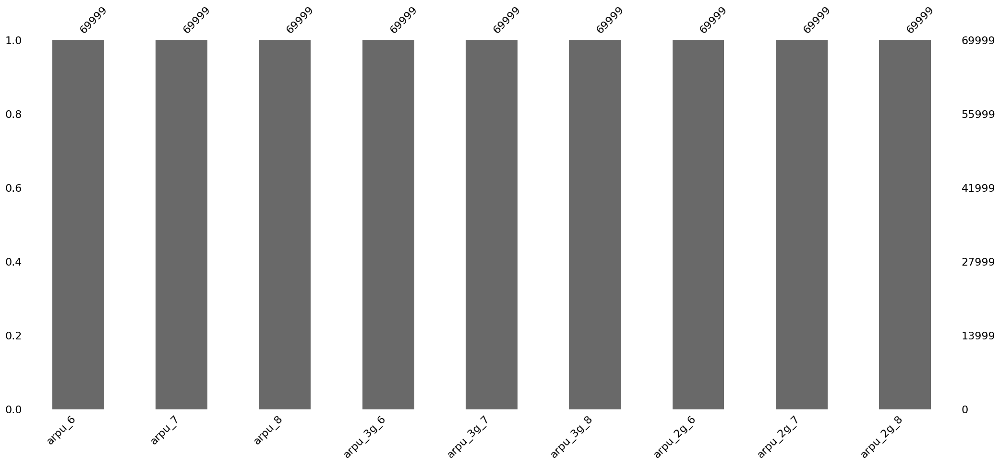

In [85]:
# Checking if there are still missing values in train set
print(train[missing_arpu_cols_list].isnull().sum())

# Visualizing the missing values in arpu_cols of train set
msno.bar(train[arpu_cols])

arpu_3g_6    0
arpu_3g_7    0
arpu_3g_8    0
arpu_2g_6    0
arpu_2g_7    0
arpu_2g_8    0
dtype: int64


<Axes: >

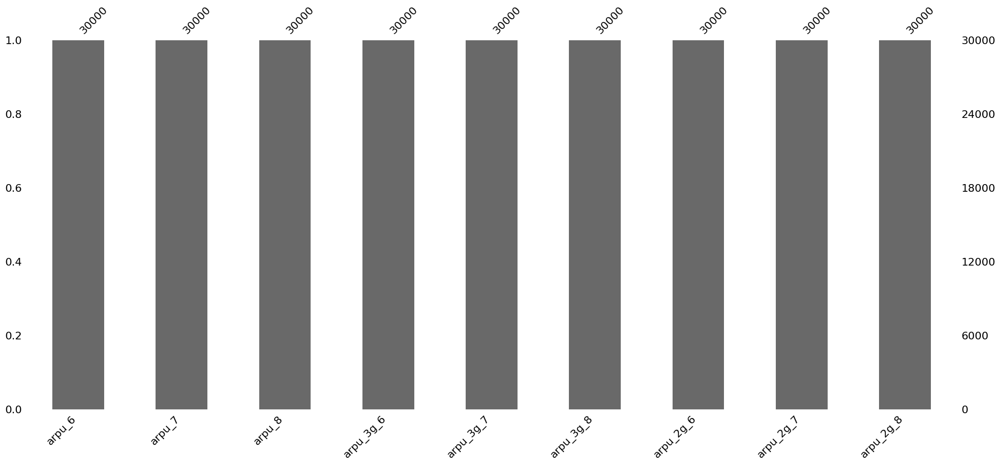

In [86]:
# Checking if there are still missing values in test set
print(test[missing_arpu_cols_list].isnull().sum())

# Visualizing the missing values in arpu_cols of test set
msno.bar(test[arpu_cols])

In [87]:
# Prining the shape of the train and test set
train.shape , test.shape

((69999, 172), (30000, 171))

## Recharge Related Columns

In [88]:
# Columns with Recharge information
rech_cols = [col for col in train.columns if re.search('rech',col)]
print(rech_cols)

['total_rech_num_6', 'total_rech_num_7', 'total_rech_num_8', 'total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'max_rech_amt_6', 'max_rech_amt_7', 'max_rech_amt_8', 'date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8', 'total_rech_data_6', 'total_rech_data_7', 'total_rech_data_8', 'max_rech_data_6', 'max_rech_data_7', 'max_rech_data_8', 'count_rech_2g_6', 'count_rech_2g_7', 'count_rech_2g_8', 'count_rech_3g_6', 'count_rech_3g_7', 'count_rech_3g_8', 'av_rech_amt_data_6', 'av_rech_amt_data_7', 'av_rech_amt_data_8']


<Axes: >

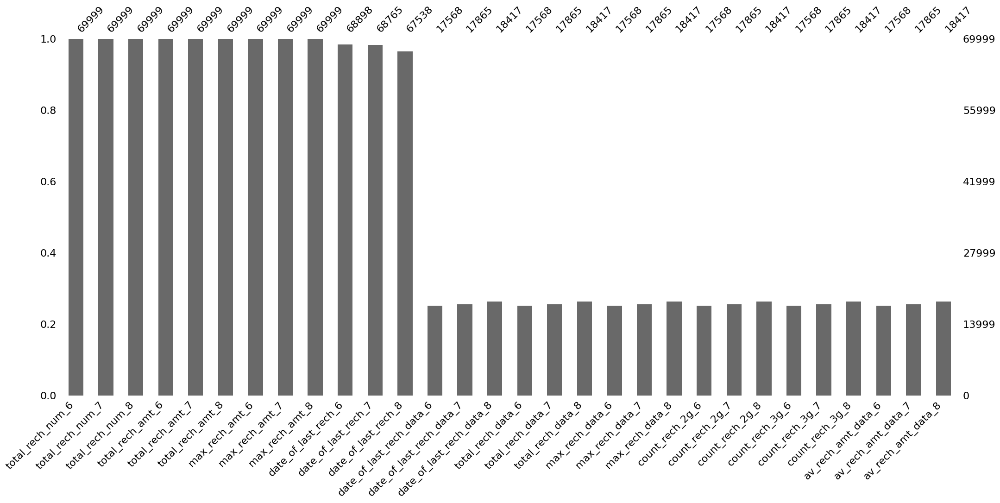

In [89]:
# Visualizing  the missing values in rech_cols of train set
msno.bar(train[rech_cols])

In [90]:
# Remove columns that contain 'date' from rech_cols
rech_cols = [col for col in rech_cols if 'date' not in col] 

# Calculate the percentage of missing values for Recharge columns
missing_percentage = train[rech_cols].isnull().mean() * 100
missing_rech_cols_list = []
# Display the results and collect columns with missing values
for col, percent in missing_percentage.items():
    if percent > 0:
        missing_rech_cols_list.append(col) 
        print(f"{col}: {percent:.2f}% missing values")

total_rech_data_6: 74.90% missing values
total_rech_data_7: 74.48% missing values
total_rech_data_8: 73.69% missing values
max_rech_data_6: 74.90% missing values
max_rech_data_7: 74.48% missing values
max_rech_data_8: 73.69% missing values
count_rech_2g_6: 74.90% missing values
count_rech_2g_7: 74.48% missing values
count_rech_2g_8: 73.69% missing values
count_rech_3g_6: 74.90% missing values
count_rech_3g_7: 74.48% missing values
count_rech_3g_8: 73.69% missing values
av_rech_amt_data_6: 74.90% missing values
av_rech_amt_data_7: 74.48% missing values
av_rech_amt_data_8: 73.69% missing values


In [91]:
# Printing the value counts of the missing rech_cols
for col in missing_rech_cols_list:
    print(f"Value counts for column '{col}':", train[col].value_counts(dropna=False))
    print("\n" + "-"*80 + "\n")

Value counts for column 'total_rech_data_6': total_rech_data_6
NaN     52431
1.0      9289
2.0      3610
3.0      1457
4.0       928
5.0       560
6.0       413
7.0       310
8.0       248
9.0       174
10.0      145
11.0      114
12.0       96
14.0       47
13.0       42
15.0       24
17.0       21
16.0       21
20.0       11
18.0       11
22.0        9
19.0        7
23.0        4
21.0        4
24.0        4
25.0        4
40.0        2
29.0        2
32.0        2
35.0        2
46.0        1
27.0        1
28.0        1
26.0        1
33.0        1
61.0        1
34.0        1
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'total_rech_data_7': total_rech_data_7
NaN     52134
1.0      8900
2.0      3642
3.0      1478
4.0      1041
5.0       713
6.0       506
7.0       370
8.0       299
10.0      201
9.0       189
11.0      149
12.0      113
13.0       49
14.0       49
15.0       33
16.0       26
17.0     

**Observation** 
-  These columns represent the recharge for various services, such as 3G or 2G, and total recharge during the months of June, July, and August. Missing values may suggest that the user did not generate any recharge during those months, so imputing the missing values with 0 would be appropriate in this context. Hence replacing the missing values of columns without the date information with 0.

In [92]:
# Replacing missing values with 0 in the train and test set
for col in missing_rech_cols_list:
    train[col].fillna(0, inplace=True)
    test[col].fillna(0, inplace=True)

total_rech_data_6     0
total_rech_data_7     0
total_rech_data_8     0
max_rech_data_6       0
max_rech_data_7       0
max_rech_data_8       0
count_rech_2g_6       0
count_rech_2g_7       0
count_rech_2g_8       0
count_rech_3g_6       0
count_rech_3g_7       0
count_rech_3g_8       0
av_rech_amt_data_6    0
av_rech_amt_data_7    0
av_rech_amt_data_8    0
dtype: int64


<Axes: >

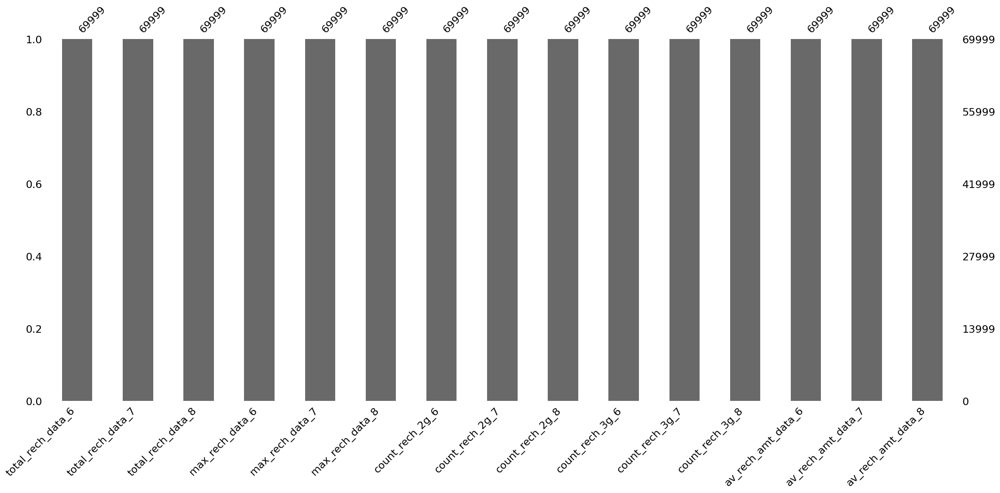

In [93]:
# Check if there are still missing values in the train set
print(train[missing_rech_cols_list].isnull().sum())

# Visualizing the missing_rech_cols_list in train set
msno.bar(train[missing_rech_cols_list])

total_rech_data_6     0
total_rech_data_7     0
total_rech_data_8     0
max_rech_data_6       0
max_rech_data_7       0
max_rech_data_8       0
count_rech_2g_6       0
count_rech_2g_7       0
count_rech_2g_8       0
count_rech_3g_6       0
count_rech_3g_7       0
count_rech_3g_8       0
av_rech_amt_data_6    0
av_rech_amt_data_7    0
av_rech_amt_data_8    0
dtype: int64


<Axes: >

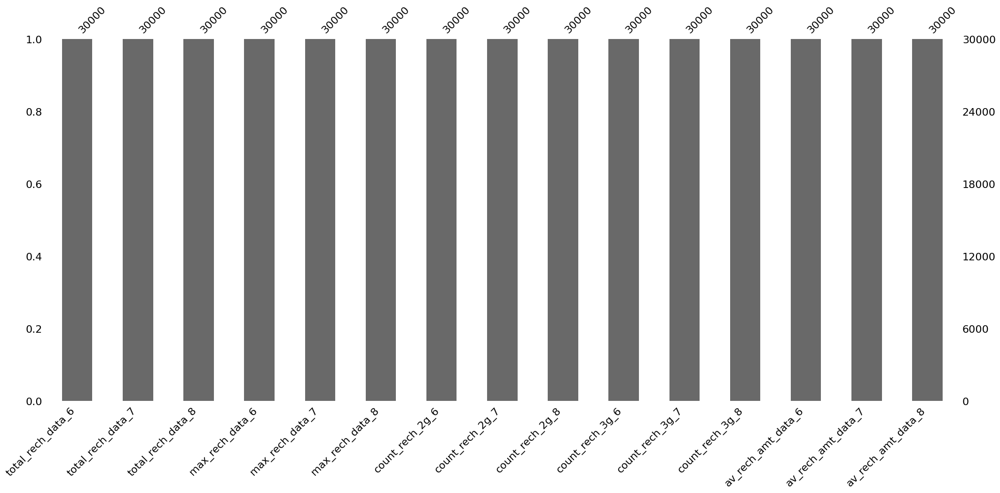

In [94]:
# Check if there are still missing values in the test set
print(test[missing_rech_cols_list].isnull().sum())

# Visualizing the missing_rech_cols_list in test set
msno.bar(test[missing_rech_cols_list])

In [95]:
# Prining the shape of the train and test set
train.shape , test.shape

((69999, 172), (30000, 171))

## ID Columns

In [96]:
# Columns with ID information
id_cols = [col for col in train.columns if re.search('id',col)]
print(id_cols)

['id', 'circle_id']


In [97]:
# Printing the value counts of the id columns
for col in id_cols:
    print(f"Value counts for column '{col}':", train[col].value_counts(dropna=False))
    print("\n" + "-"*80 + "\n")

Value counts for column 'id': id
69998    1
0        1
1        1
2        1
3        1
        ..
18       1
19       1
20       1
21       1
22       1
Name: count, Length: 69999, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'circle_id': circle_id
109    69999
Name: count, dtype: int64

--------------------------------------------------------------------------------



**Observation**:
-  'id' column has all unique values. Hence dropping it in the train set. We need the this column in the test for the final submisson, hence not removing in test set.
-  'circle_id' is a single valued column. Hence dropping it from both train and test set.

In [98]:
# Dropping 'id' and 'circle_id' from train set
train = train.drop(columns=['id', 'circle_id'],axis=1)

# Dropping 'circle_id' from test set as we need to create the submission csv.
test = test.drop(columns=['circle_id'],axis=1)

In [99]:
# Prining the shape of the train and test set
train.shape , test.shape

((69999, 170), (30000, 170))

## Single Value Columns

In [100]:
# Printing column names with single unique value
cols_with_single_value=[col for col in train.columns if train[col].nunique()==1]
cols_with_single_value

['loc_og_t2o_mou',
 'std_og_t2o_mou',
 'loc_ic_t2o_mou',
 'last_date_of_month_6',
 'last_date_of_month_7',
 'last_date_of_month_8',
 'std_og_t2c_mou_6',
 'std_og_t2c_mou_7',
 'std_og_t2c_mou_8',
 'std_ic_t2o_mou_6',
 'std_ic_t2o_mou_7',
 'std_ic_t2o_mou_8']

In [101]:
# Printing the value counts of the cols_with_single_value columns
for col in cols_with_single_value:
    print(f"Value counts for column '{col}':", train[col].value_counts(dropna=False))
    print("\n" + "-"*80 + "\n")

Value counts for column 'loc_og_t2o_mou': loc_og_t2o_mou
0.0    69297
NaN      702
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'std_og_t2o_mou': std_og_t2o_mou
0.0    69297
NaN      702
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'loc_ic_t2o_mou': loc_ic_t2o_mou
0.0    69297
NaN      702
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'last_date_of_month_6': last_date_of_month_6
6/30/2014    69999
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'last_date_of_month_7': last_date_of_month_7
7/31/2014    69600
NaN            399
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value count

**Observation**
- Single unique value in columns does not add any information to the analysis. Hence dropping them.

In [102]:
# Dropping cols_with_single_value from train and test set
train = train.drop(cols_with_single_value,axis=1)
test = test.drop(cols_with_single_value,axis=1)

In [103]:
# Prining the shape of the train and test set
train.shape , test.shape

((69999, 158), (30000, 158))

## Date Columns

In [104]:
# Creating a list of date columns
date_columns = [col for col in list(train.columns) if re.search('date',col)]
print(date_columns)

['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8', 'date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8']


<Axes: >

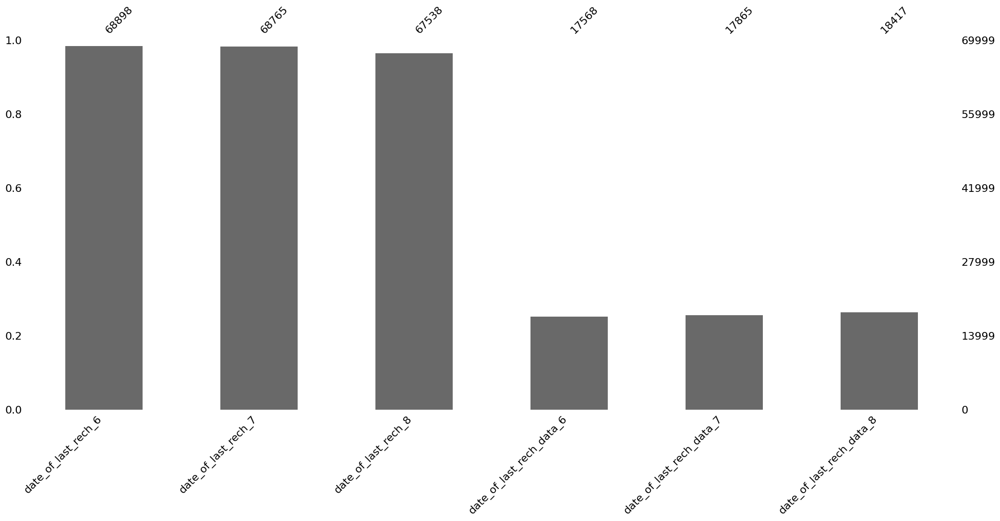

In [105]:
# Visualizing the missing values date_columns in train set
msno.bar(train[date_columns])

In [106]:
# Printing the value counts of the date_cols
for col in date_columns:
    print(f"Value counts for column '{col}':", train[col].value_counts(dropna=False))
    print("\n" + "-"*80 + "\n")

Value counts for column 'date_of_last_rech_6': date_of_last_rech_6
6/30/2014    11880
6/29/2014     9049
6/27/2014     7800
6/28/2014     6752
6/26/2014     3918
6/25/2014     3402
6/24/2014     2888
6/17/2014     2887
6/14/2014     2686
6/21/2014     2654
6/23/2014     2060
6/18/2014     1886
6/12/2014     1746
6/22/2014     1624
6/13/2014     1468
6/19/2014     1387
6/20/2014     1252
NaN           1101
6/16/2014      783
6/15/2014      605
6/11/2014      398
6/8/2014       368
6/5/2014       229
6/7/2014       223
6/10/2014      200
6/3/2014       172
6/1/2014       155
6/9/2014       135
6/6/2014       123
6/4/2014        90
6/2/2014        78
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'date_of_last_rech_7': date_of_last_rech_7
7/31/2014    12206
7/30/2014     9716
7/25/2014     6577
7/29/2014     6320
7/28/2014     5370
7/27/2014     4136
7/26/2014     3765
7/24/2014     2750
7/19/2014     21

In [107]:
# Calculate the percentage of missing values for Recharge columns
missing_percentage = train[date_columns].isnull().mean() * 100
missing_date_cols_list = []
# Display the results and collect columns with missing values
for col, percent in missing_percentage.items():
    if percent > 0:
        missing_date_cols_list.append(col) 
        print(f"{col}: {percent:.2f}% missing values")

date_of_last_rech_6: 1.57% missing values
date_of_last_rech_7: 1.76% missing values
date_of_last_rech_8: 3.52% missing values
date_of_last_rech_data_6: 74.90% missing values
date_of_last_rech_data_7: 74.48% missing values
date_of_last_rech_data_8: 73.69% missing values


In [108]:
# Create a list of columns with more than 50% missing values
date_columns_with_high_missing_values = [col for col in missing_date_cols_list if train[col].isnull().mean() * 100 > 50]

# Display the list of columns with more than 50% missing values
print("Columns with more than 50% missing values:", date_columns_with_high_missing_values)

Columns with more than 50% missing values: ['date_of_last_rech_data_6', 'date_of_last_rech_data_7', 'date_of_last_rech_data_8']


In [109]:
# Dropping categorical_columns_with_high_missing_values from train and test set
train = train.drop(date_columns_with_high_missing_values,axis=1)
test = test.drop(date_columns_with_high_missing_values,axis=1)

In [110]:
# Updating list
date_columns = [col for col in list(train.columns) if re.search('date',col)]
print(date_columns)

['date_of_last_rech_6', 'date_of_last_rech_7', 'date_of_last_rech_8']


**Observation**
-  For timeseries data, we will use linear interplolation between a set of points as data is available for months and missing for the others.

In [111]:
# Function to convert mixed date formats
def convert_mixed_date_format(col):
    # Attempt both formats, coercing errors to handle invalid formats
    return pd.to_datetime(train[col], errors='coerce', format='%m/%d/%Y').fillna(
           pd.to_datetime(train[col], errors='coerce', format='%m-%d-%Y'))

In [112]:
# Applying linear interpolation to date columns on train and test set
for col in date_columns:
    # Converting all identified date columns
    train[col] = convert_mixed_date_format(col)
    test[col] = convert_mixed_date_format(col)
    
    train[col] = train[col].interpolate(method='linear')
    test[col] = test[col].interpolate(method='linear')
    
    # Forward fill to handle missing values at the start
    train[col].fillna(method='ffill', inplace=True)
    test[col].fillna(method='ffill', inplace=True)
    
    # Backward fill to handle missing values at the end
    train[col].fillna(method='bfill', inplace=True)
    test[col].fillna(method='bfill', inplace=True)
    
    # Convert the datetime column back to string format with only date (YYYY-MM-DD)
    train[col] = train[col].dt.strftime('%Y-%m-%d')
    test[col] = test[col].dt.strftime('%Y-%m-%d')

Missing values in date_of_last_rech_6: 0
Missing values in date_of_last_rech_7: 0
Missing values in date_of_last_rech_8: 0


<Axes: >

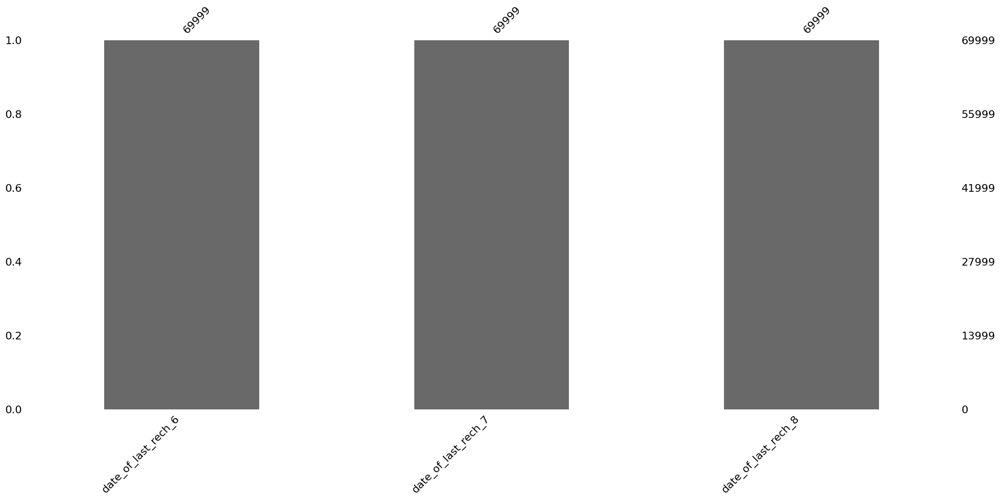

In [113]:
# Checking for remaining missing values in date columns in train set
for col in date_columns:
    print(f"Missing values in {col}: {train[col].isna().sum()}")

# Visualizing the missing values date_columns in train set
msno.bar(train[date_columns])

Extracting the day on the month from the date columns.

In [114]:
# Get the day of the month (e.g., 21)
def get_day_of_month(date_str): 
    date_obj = datetime.strptime(date_str, '%Y-%m-%d')
    return date_obj.day

In [115]:
# Looping through each date column and apply the functions to get the day of the month in train and test set
for col in date_columns:
    # Create new columns day of the month
    train[f'day_{col}'] = train[col].apply(get_day_of_month)
    test[f'day_{col}'] = test[col].apply(get_day_of_month)

In [116]:
# Dropping date columns from the train and test set
train = train.drop(columns=date_columns, axis=1)
test = test.drop(columns=date_columns, axis=1)

In [117]:
# Prining the shape of the train and test set
train.shape , test.shape

((69999, 155), (30000, 155))

## Categorical Columns

In [118]:
# Finding columns with less than 20 unique values to identify the categorical columns
categorical_columns=[col for col in train.columns if train[col].nunique()<20]
categorical_columns = [col for col in categorical_columns if col != 'churn_probability']

print(categorical_columns)

['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8', 'fb_user_6', 'fb_user_7', 'fb_user_8']


In [119]:
# Printing the value counts of cols_less_unique_value
for col in categorical_columns:
    print(f"Value counts for column '{col}':", train[col].value_counts(dropna=False))
    print("\n" + "-"*80 + "\n")

Value counts for column 'night_pck_user_6': night_pck_user_6
NaN    52431
0.0    17124
1.0      444
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'night_pck_user_7': night_pck_user_7
NaN    52134
0.0    17435
1.0      430
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'night_pck_user_8': night_pck_user_8
NaN    51582
0.0    18030
1.0      387
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'monthly_2g_6': monthly_2g_6
0    64896
1     4688
2      389
3       20
4        6
Name: count, dtype: int64

--------------------------------------------------------------------------------

Value counts for column 'monthly_2g_7': monthly_2g_7
0    64695
1     4806
2      467
3       27
4        3
5        1
Name: count, dtype: int64

----------

<Axes: >

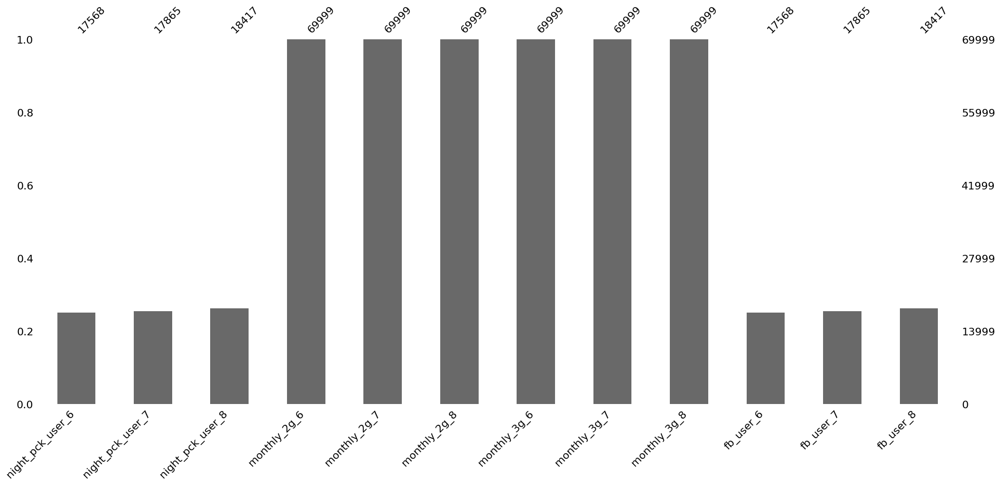

In [120]:
# Visualizing the missing values categorical_columns in train set
msno.bar(train[categorical_columns])

In [121]:
# Create a list of columns with more than 50% missing values
categorical_columns_with_high_missing_values = [col for col in categorical_columns if train[col].isnull().mean()*100 > 50]

# Display the list of columns with more than 50% missing values
print("Columns with more than 50% missing values:", categorical_columns_with_high_missing_values)

Columns with more than 50% missing values: ['night_pck_user_6', 'night_pck_user_7', 'night_pck_user_8', 'fb_user_6', 'fb_user_7', 'fb_user_8']


In [122]:
# Dropping categorical_columns_with_high_missing_values from train and test set
train = train.drop(categorical_columns_with_high_missing_values,axis=1)
test = test.drop(categorical_columns_with_high_missing_values,axis=1)

In [123]:
# Updating the categorical_columns
categorical_columns=[col for col in train.columns if train[col].nunique()<20]
categorical_columns = [col for col in categorical_columns if col != 'churn_probability']

print(categorical_columns)

['monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8']


**Observation**:
-  Imputing the missing values in categorical columns as -1 so that they indicate they are not a valid category value. 

In [124]:
# Imputing the missing values in categorical columns as -1 in the train and test set
train[categorical_columns] = train[categorical_columns].apply(lambda x:x.fillna(-1))
test[categorical_columns] = test[categorical_columns].apply(lambda x:x.fillna(-1))

# Converting the categorical columns as category type
train[categorical_columns] = train[categorical_columns].astype('category')
test[categorical_columns] = test[categorical_columns].astype('category')

monthly_2g_6    0
monthly_2g_7    0
monthly_2g_8    0
monthly_3g_6    0
monthly_3g_7    0
monthly_3g_8    0
dtype: int64


<Axes: >

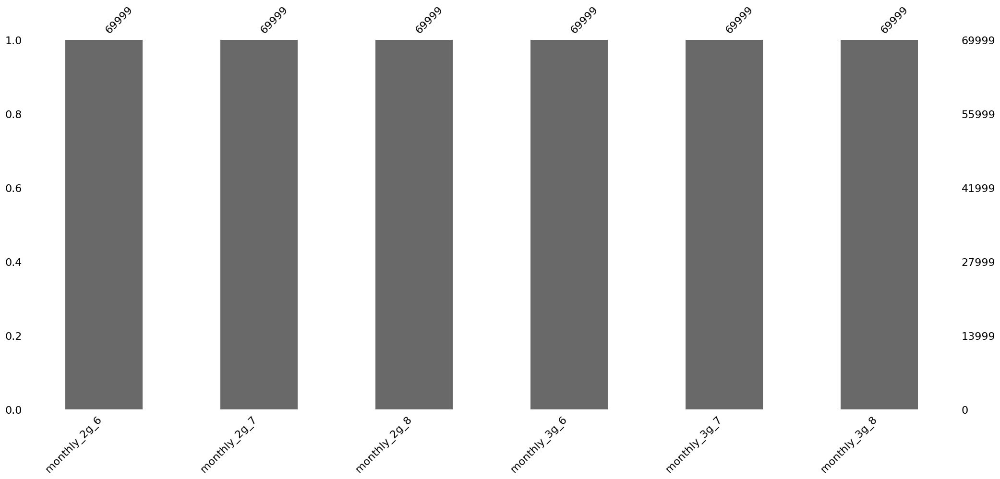

In [125]:
# Check if there are still missing values in categorical_columns of train set
print(train[categorical_columns].isnull().sum())

# Visualizing the missing values categorical_columns in train set
msno.bar(train[categorical_columns])

monthly_2g_6    0
monthly_2g_7    0
monthly_2g_8    0
monthly_3g_6    0
monthly_3g_7    0
monthly_3g_8    0
dtype: int64


<Axes: >

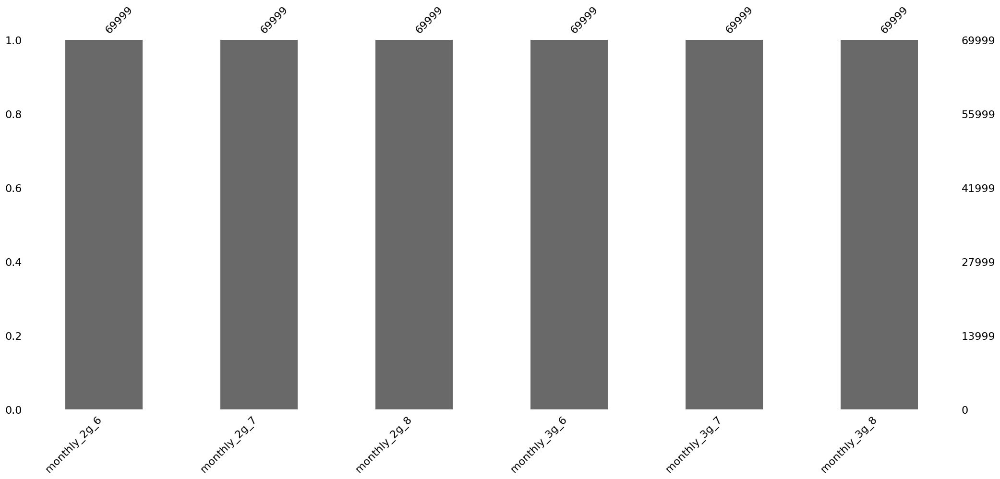

In [126]:
# Check if there are still missing values in categorical_columns of test set
print(train[categorical_columns].isnull().sum())

# Visualizing the missing values categorical_columns in test set
msno.bar(train[categorical_columns])

In [127]:
# Prining the shape of the train and test set

train.shape , test.shape

((69999, 149), (30000, 149))

##  Imputation Using MICE

Using MICE imputation as missing data not related to other features

###  Handling Missing Values in the Train Set

#### Percentage of Missing Values in Columns and Rows in train set

In [128]:
# Checking column wise null percentage
col_null_percentage = pd.DataFrame(100 * train.isnull().mean(), columns =['percentage_missing_values']).sort_values(by="percentage_missing_values")
print(col_null_percentage[col_null_percentage['percentage_missing_values']!=0])

                  percentage_missing_values
loc_og_t2f_mou_7                   3.838626
loc_og_t2t_mou_7                   3.838626
roam_og_mou_7                      3.838626
spl_og_mou_7                       3.838626
ic_others_7                        3.838626
roam_ic_mou_7                      3.838626
offnet_mou_7                       3.838626
onnet_mou_7                        3.838626
og_others_7                        3.838626
isd_ic_mou_7                       3.838626
isd_og_mou_7                       3.838626
spl_ic_mou_7                       3.838626
loc_og_t2m_mou_7                   3.838626
loc_og_t2c_mou_7                   3.838626
std_ic_mou_7                       3.838626
loc_ic_t2t_mou_7                   3.838626
loc_ic_t2m_mou_7                   3.838626
loc_ic_t2f_mou_7                   3.838626
loc_ic_mou_7                       3.838626
std_ic_t2t_mou_7                   3.838626
std_ic_t2f_mou_7                   3.838626
std_ic_t2m_mou_7                

In [129]:
# Creating a list of columns with missing value
cols_with_missing_values = col_null_percentage[col_null_percentage['percentage_missing_values'] != 0].index.tolist()

# Creating an instance of the IterativeImputer
mice_imputer = IterativeImputer()

# Applying MICE imputation to the train DataFrame 
train[cols_with_missing_values] = mice_imputer.fit_transform(train[cols_with_missing_values])
# Applying MICE imputation to the test set 
test[cols_with_missing_values] = mice_imputer.transform(test[cols_with_missing_values])

In [130]:
# Printing shape of the train and test set
train.shape , test.shape

((69999, 149), (30000, 149))

**Observation**:
-  No missing column values after imputation.
-  No missing row values.

# 3. Filter high-value customers

Three phases of customer lifecycle :
- The ‘good’ phase : Month 6 (June) & Month 7 (July)
- The ‘action’ phase :Month 8 (August)
- The ‘churn’ phase : Month 9 (September)

In [131]:
# Deriving new columns for Total Recharge Amount for the 'Good Phase' in the train set
train['avg_amt_6_7'] = (train['total_rech_amt_6'] + train['total_rech_amt_7']) /2

In [132]:
# Defining high-value thresholds 
# Recharge threshold: 70th percentile of total average recharge amount for months 6 and 7
recharge_threshold = train['avg_amt_6_7'].quantile(0.60)

# Displaying thresholds
print(f"Recharge Threshold: {recharge_threshold}")

Recharge Threshold: 288.5


In [133]:
# Filter high value customers in the new dataframe (high_val_train) where total recharge is more than threshold 
high_val_train = train[train['avg_amt_6_7'] >= recharge_threshold].copy()

In [134]:
# Dropping 'avg_amt_6_7' column
high_val_train=high_val_train.drop(['avg_amt_6_7'],axis=1)
high_val_train =high_val_train.reset_index(drop=True)

In [135]:
# Printing shape of the train and test set
high_val_train.shape , test.shape

((28019, 149), (30000, 149))

# 4. Derive New Columns

## Difference Between 8th month and the Previous Months
 Creating new variables to capture the difference between values from the 8th month and previous months (6th and 7th months) to provide insights into month-over-month changes.

Creating new variables to identify the fields

In [136]:
# Identifying the columns
# Finding columns with '_6' as a suffix using regular expressions
columns_with_6 = [col for col in high_val_train.columns if re.search(r'_6$', col)]

# Display the columns
print(columns_with_6)

['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'total_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6', 'total_ic_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6', 'total_rech_num_6', 'total_rech_amt_6', 'max_rech_amt_6', 'last_day_rch_amt_6', 'total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6', 'count_rech_3g_6', 'av_rech_amt_data_6', 'vol_2g_mb_6', 'vol_3g_mb_6', 'arpu_3g_6', 'arpu_2g_6', 'monthly_2g_6', 'sachet_2g_6', 'monthly_3g_6', 'sachet_3g_6', 'day_date_of_last_rech_6']


In [137]:
# Removing categorical columns
filtered_columns = [col for col in columns_with_6 if col not in categorical_columns]
filtered_columns = [col for col in filtered_columns if 'day' not in col]
print(filtered_columns)

['arpu_6', 'onnet_mou_6', 'offnet_mou_6', 'roam_ic_mou_6', 'roam_og_mou_6', 'loc_og_t2t_mou_6', 'loc_og_t2m_mou_6', 'loc_og_t2f_mou_6', 'loc_og_t2c_mou_6', 'loc_og_mou_6', 'std_og_t2t_mou_6', 'std_og_t2m_mou_6', 'std_og_t2f_mou_6', 'std_og_mou_6', 'isd_og_mou_6', 'spl_og_mou_6', 'og_others_6', 'total_og_mou_6', 'loc_ic_t2t_mou_6', 'loc_ic_t2m_mou_6', 'loc_ic_t2f_mou_6', 'loc_ic_mou_6', 'std_ic_t2t_mou_6', 'std_ic_t2m_mou_6', 'std_ic_t2f_mou_6', 'std_ic_mou_6', 'total_ic_mou_6', 'spl_ic_mou_6', 'isd_ic_mou_6', 'ic_others_6', 'total_rech_num_6', 'total_rech_amt_6', 'max_rech_amt_6', 'total_rech_data_6', 'max_rech_data_6', 'count_rech_2g_6', 'count_rech_3g_6', 'av_rech_amt_data_6', 'vol_2g_mb_6', 'vol_3g_mb_6', 'arpu_3g_6', 'arpu_2g_6', 'sachet_2g_6', 'sachet_3g_6']


In [138]:
# List of base column names
month_columns  = [col.replace('_6', '') for col in filtered_columns]
print(month_columns)

['arpu', 'onnet_mou', 'offnet_mou', 'roam_ic_mou', 'roam_og_mou', 'loc_og_t2t_mou', 'loc_og_t2m_mou', 'loc_og_t2f_mou', 'loc_og_t2c_mou', 'loc_og_mou', 'std_og_t2t_mou', 'std_og_t2m_mou', 'std_og_t2f_mou', 'std_og_mou', 'isd_og_mou', 'spl_og_mou', 'og_others', 'total_og_mou', 'loc_ic_t2t_mou', 'loc_ic_t2m_mou', 'loc_ic_t2f_mou', 'loc_ic_mou', 'std_ic_t2t_mou', 'std_ic_t2m_mou', 'std_ic_t2f_mou', 'std_ic_mou', 'total_ic_mou', 'spl_ic_mou', 'isd_ic_mou', 'ic_others', 'total_rech_num', 'total_rech_amt', 'max_rech_amt', 'total_rech_data', 'max_rech_data', 'count_rech_2g', 'count_rech_3g', 'av_rech_amt_data', 'vol_2g_mb', 'vol_3g_mb', 'arpu_3g', 'arpu_2g', 'sachet_2g', 'sachet_3g']


In [139]:
# Looping through each column column to calculate the difference of train and test set
for col in month_columns:
    print(f"high_val_train['{col}_diff'] = high_val_train.{col}_8 - ((high_val_train.{col}_6 + high_val_train.{col}_7)/2)\n")
    high_val_train[f'{col}_diff'] = high_val_train[f'{col}_8'] - (
        (high_val_train[f'{col}_6'] + high_val_train[f'{col}_7']) / 2
    )
    test[f'{col}_diff'] = test[f'{col}_8'] - (
        (test[f'{col}_6'] + test[f'{col}_7']) / 2
    )  

high_val_train['arpu_diff'] = high_val_train.arpu_8 - ((high_val_train.arpu_6 + high_val_train.arpu_7)/2)

high_val_train['onnet_mou_diff'] = high_val_train.onnet_mou_8 - ((high_val_train.onnet_mou_6 + high_val_train.onnet_mou_7)/2)

high_val_train['offnet_mou_diff'] = high_val_train.offnet_mou_8 - ((high_val_train.offnet_mou_6 + high_val_train.offnet_mou_7)/2)

high_val_train['roam_ic_mou_diff'] = high_val_train.roam_ic_mou_8 - ((high_val_train.roam_ic_mou_6 + high_val_train.roam_ic_mou_7)/2)

high_val_train['roam_og_mou_diff'] = high_val_train.roam_og_mou_8 - ((high_val_train.roam_og_mou_6 + high_val_train.roam_og_mou_7)/2)

high_val_train['loc_og_t2t_mou_diff'] = high_val_train.loc_og_t2t_mou_8 - ((high_val_train.loc_og_t2t_mou_6 + high_val_train.loc_og_t2t_mou_7)/2)

high_val_train['loc_og_t2m_mou_diff'] = high_val_train.loc_og_t2m_mou_8 - ((high_val_train.loc_og_t2m_mou_6 + high_val_train.loc_og_t2m_mou_7)/2)

high_val_train['loc_og_t2f_mou_diff'] = high_val_train.loc_og_t2f_mou_8

In [140]:
# Printing the first five rows
high_val_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,churn_probability,day_date_of_last_rech_6,day_date_of_last_rech_7,day_date_of_last_rech_8,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_t2t_mou_diff,loc_og_t2m_mou_diff,loc_og_t2f_mou_diff,loc_og_t2c_mou_diff,loc_og_mou_diff,std_og_t2t_mou_diff,std_og_t2m_mou_diff,std_og_t2f_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,og_others_diff,total_og_mou_diff,loc_ic_t2t_mou_diff,loc_ic_t2m_mou_diff,loc_ic_t2f_mou_diff,loc_ic_mou_diff,std_ic_t2t_mou_diff,std_ic_t2m_mou_diff,std_ic_t2f_mou_diff,std_ic_mou_diff,total_ic_mou_diff,spl_ic_mou_diff,isd_ic_mou_diff,ic_others_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,count_rech_2g_diff,count_rech_3g_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,arpu_3g_diff,arpu_2g_diff,sachet_2g_diff,sachet_3g_diff
0,292.724,228.753,418.233,135.54,63.61,177.36,46.39,65.48,92.81,0.00,0.0,0.0,0.00,0.0,0.0,86.39,27.59,82.33,43.28,29.49,83.54,0.58,0.36,0.00,2.53,0.0,0.0,130.26,57.46,165.88,49.14,36.01,95.03,0.00,35.61,9.26,0.0,0.00,0.00,49.14,71.63,104.29,0.0,0.0,0.0,2.53,0.0,0.35,0.00,0.0,0.0,181.94,129.09,270.53,66.34,62.03,115.13,60.46,45.23,61.26,0.38,0.00,0.41,127.19,107.26,176.81,6.73,44.76,86.19,0.00,2.65,18.96,0.00,0.00,0.00,6.73,47.41,105.16,133.93,154.68,281.98,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,10,6,8,410,220,460,110,50,130,110,50,50,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,0,648,0.0,0.0,0.0,0,28,31,27,157.4945,77.785,36.875,0.00,0.000,25.340,47.155,-0.470,-1.265,72.020,52.455,-8.545,0.000,43.905,0.0,-0.915,0.000,115.015,50.945,8.415,0.220,59.585,60.445,17.635,0.000,78.090,137.675,0.000,0.0,0.00,0.0,145.0,50.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000,0.0,0.0
1,439.919,397.946,392.024,244.46,108.31,42.98,571.98,727.91,644.43,0.00,0.0,0.0

In [141]:
# Printing shape of the high_val_train and test set
high_val_train.shape , test.shape

((28019, 193), (30000, 193))

## Ratio of Total Outgoing Amount and Age of User on network ('aon') 
This ratio gives an indication of average daily usage relative to the user’s experience on the network.

In [142]:
# Calculating the total outgoing amount for train set
high_val_train['total_og_mou'] = high_val_train[['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8']].sum(axis=1)
        
# Calculating the ratio of total outgoing amount to age of user on the network
high_val_train['ratio_og_mou_aon'] = high_val_train['total_og_mou'] / high_val_train['aon'].replace(0, np.nan)  
        
# Filling NaN values with 0 
high_val_train['ratio_og_mou_aon'] = high_val_train['ratio_og_mou_aon'].fillna(0)

# Checking the results
print(high_val_train[['total_og_mou', 'aon', 'ratio_og_mou_aon']])

       total_og_mou   aon  ratio_og_mou_aon
0            581.56   648          0.897469
1           2340.08   322          7.267329
2            666.55  1049          0.635415
3           1085.96   602          1.803920
4           1477.62  2837          0.520839
...             ...   ...               ...
28014       2629.30   283          9.290813
28015        116.91   251          0.465777
28016       1867.40   282          6.621986
28017       1051.36   879          1.196086
28018         83.39   277          0.301047

[28019 rows x 3 columns]


In [143]:
# Calculating the total outgoing amount for test set
test['total_og_mou'] = test[['total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8']].sum(axis=1)
        
# Calculating the ratio of total outgoing amount to age of user on the network
test['ratio_og_mou_aon'] = test['total_og_mou'] / test['aon'].replace(0, np.nan)  
        
# Filling NaN values with 0 
test['ratio_og_mou_aon'] = test['ratio_og_mou_aon'].fillna(0)

# Checking the results
print(test[['total_og_mou', 'aon', 'ratio_og_mou_aon']])

       total_og_mou   aon  ratio_og_mou_aon
0            202.27  1692          0.119545
1           1628.51  2533          0.642917
2              0.00   277          0.000000
3            276.55  1244          0.222307
4           1932.85   462          4.183658
...             ...   ...               ...
29995       1317.46  1255          1.049769
29996       1795.42  2258          0.795137
29997        129.61   440          0.294568
29998       3421.58   810          4.224173
29999        416.87   440          0.947432

[30000 rows x 3 columns]


## Standard Deviation of the Total Amount Paid

In [144]:
# Total Amount Columns
total_amounts = [i for i in list(high_val_train.columns) if re.search('total.+amt',i)]
print(total_amounts)

['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_rech_amt_diff']


In [145]:
# Creating a new column for Standard Deviation
high_val_train['total_rech_amt_std'] = high_val_train[['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8']].std(axis=1)
test['total_rech_amt_std'] = test[['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8']].std(axis=1)

# Checking the results
print(high_val_train[['total_rech_amt_6', 'total_rech_amt_7', 'total_rech_amt_8', 'total_rech_amt_std']])

       total_rech_amt_6  total_rech_amt_7  total_rech_amt_8  \
0                   410               220               460   
1                   521               418               365   
2                   530               170               300   
3                   654               400               652   
4                   361               371               327   
...                 ...               ...               ...   
28014              1896               900              1950   
28015               251               381               205   
28016               346               480               796   
28017               626               250               397   
28018               379               252               145   

       total_rech_amt_std  
0              126.622799  
1               79.324229  
2              182.300119  
3              146.073041  
4               23.065125  
...                   ...  
28014          591.246142  
28015           91.

In [146]:
# Printing the high_val_train and test shape
high_val_train.shape , test.shape

((28019, 196), (30000, 196))

# 5. Handling outliers

The outliers are capped with k-sigma method.

In [147]:
# Creating a list of columns having data type as float or int
numerical_columns = high_val_train.select_dtypes(include=['float64','int64']).columns.tolist()

# Removing Target Variable 'churn_probability' from the list
numerical_columns= [col for col in numerical_columns if col != 'churn_probability']

# Removing columns with 'date' in the name
numerical_columns = [col for col in numerical_columns if 'date' not in col]
print(numerical_columns)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'lo

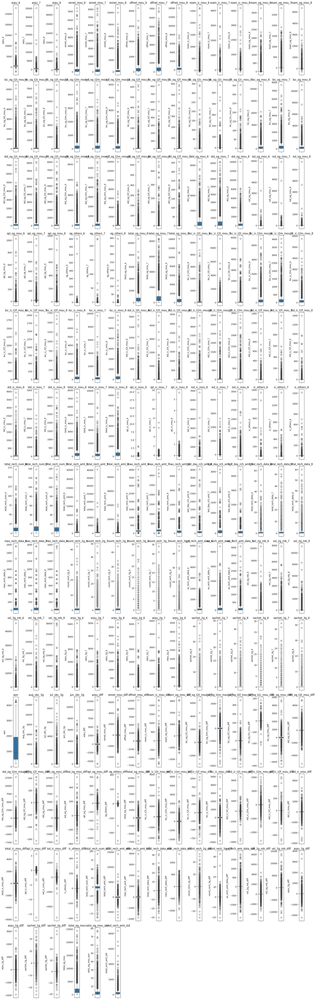

In [148]:
# Plotting box plot to visualize the outliers

# Defining the number of columns per row
cols_per_row = 15

# Total number of numerical columns
num_columns = len(numerical_columns)

# Calculating the number of rows required (using math.ceil to round up)
rows = math.ceil(num_columns / cols_per_row)

# Creatinh the subplots
fig, axes = plt.subplots(rows, cols_per_row, figsize=(20, 5 * rows))  

# Flatten axes for easy iteration
axes = axes.flatten()

# Plotting box plots for each numerical column
for i, col in enumerate(numerical_columns):
    if col in high_val_train.columns:  
        sns.boxplot(y=high_val_train[col], ax=axes[i])  
        axes[i].set_title(col)
        axes[i].tick_params(axis='x', rotation=45)
    else:
        print(f"Column {col} does not exist in high_val_train.")

# Removing any empty subplots if columns are not a multiple of cols_per_row
for j in range(i + 1, rows * cols_per_row):
    fig.delaxes(axes[j])

# Adjusting layout to prevent overlap
plt.tight_layout()
plt.show()

In [149]:
def cap_outliers(array, k=3):
    upper_limit = array.mean() + k*array.std()
    lower_limit = array.mean() - k*array.std()
    array[array<lower_limit] = lower_limit
    array[array>upper_limit] = upper_limit
    return array

In [150]:
# Removing outliers from the numerical columns from high_val_train and test set
high_val_train[numerical_columns] = high_val_train[numerical_columns].apply(cap_outliers, axis=0)
test[numerical_columns] = test[numerical_columns].apply(cap_outliers, axis=0)

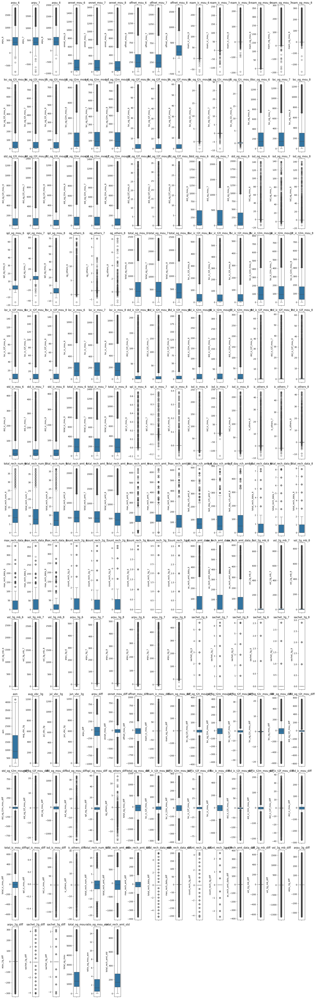

In [151]:
# Creating box plots for numerical columns after remvoing outliers
# Defining the number of columns per row (15 in this case)
cols_per_row = 15

# Total number of numerical columns
num_columns = len(numerical_columns)

# Calculating the number of rows required (using math.ceil to round up)
rows = math.ceil(num_columns / cols_per_row)

# Creating the subplots
fig, axes = plt.subplots(rows, cols_per_row, figsize=(20, 5 * rows))  

# Flatten axes for easy iteration
axes = axes.flatten()

# Plotting box plots for each numerical column
for i, col in enumerate(numerical_columns):
    if col in high_val_train.columns:  
        sns.boxplot(y=high_val_train[col], ax=axes[i])  
        axes[i].set_title(col)
        axes[i].tick_params(axis='x', rotation=45)
    else:
        print(f"Column {col} does not exist in high_val_train.")

# Removing any empty subplots if columns are not a multiple of cols_per_row
for j in range(i + 1, rows * cols_per_row):
    fig.delaxes(axes[j])

# Adjusting layout to prevent overlap
plt.tight_layout()
plt.show()

# 6. Exploratory Data Analysis

## Univariate Analysis of Categorical Columns

### Analysis of Target Variable 'churn_probability'

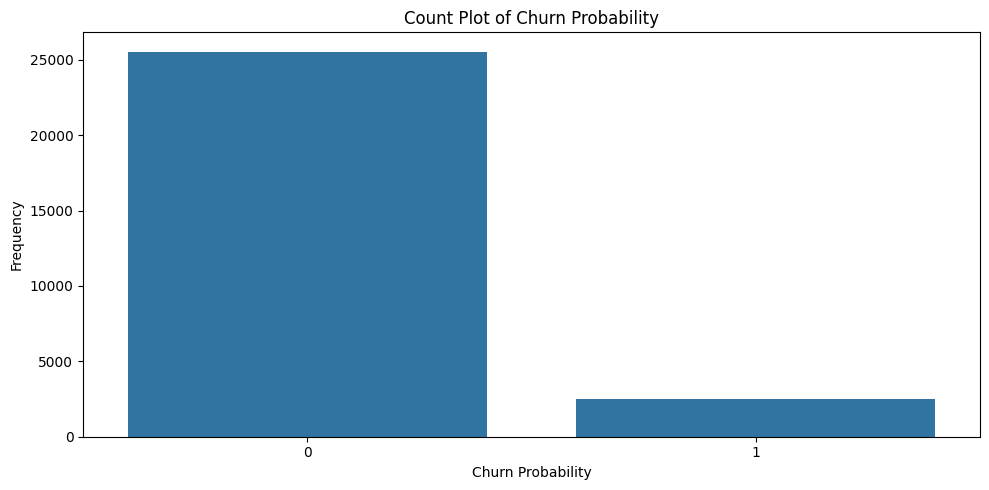

In [152]:
# Creating the subplots
fig, ax = plt.subplots(figsize=(10, 5))

# Creating a count plot
sns.countplot(data=high_val_train, x='churn_probability', ax=ax)
ax.set_title('Count Plot of Churn Probability')
ax.set_xlabel('Churn Probability')
ax.set_ylabel('Frequency')

# Show the plot
plt.tight_layout()
plt.show()

**Observation**:
- Clearly there is data imbalance which will be handled later.

### Univariate Analysis of Categorical Columns

In [153]:
# Finding Categorical Columns
categorical_columns = high_val_train.select_dtypes(include=['category']).columns.tolist()
print(categorical_columns)

['monthly_2g_6', 'monthly_2g_7', 'monthly_2g_8', 'monthly_3g_6', 'monthly_3g_7', 'monthly_3g_8']



Percentage Distribution of monthly_2g_6
0    89.30
1     9.55
2     1.05
3     0.07
4     0.02
Name: count, dtype: float64


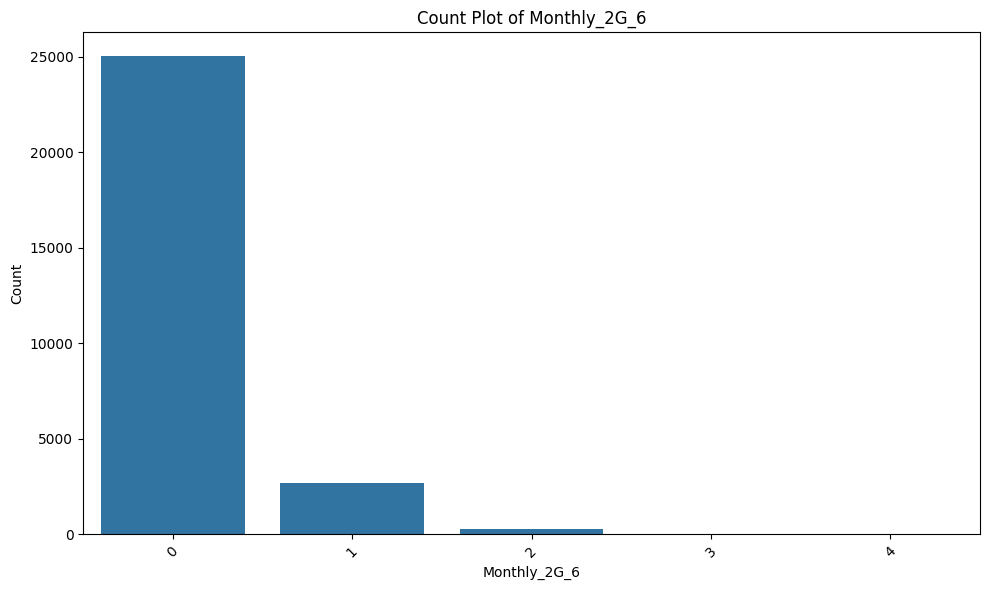


Percentage Distribution of monthly_2g_7
0    88.79
1     9.80
2     1.31
3     0.09
4     0.01
5     0.00
Name: count, dtype: float64


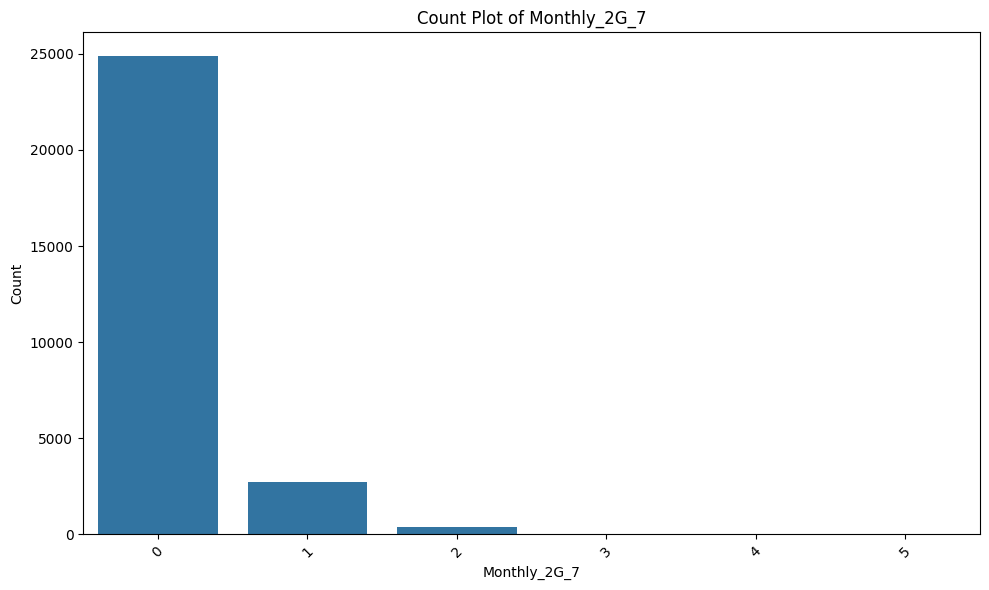


Percentage Distribution of monthly_2g_8
0    90.05
1     9.02
2     0.84
3     0.07
4     0.01
5     0.00
Name: count, dtype: float64


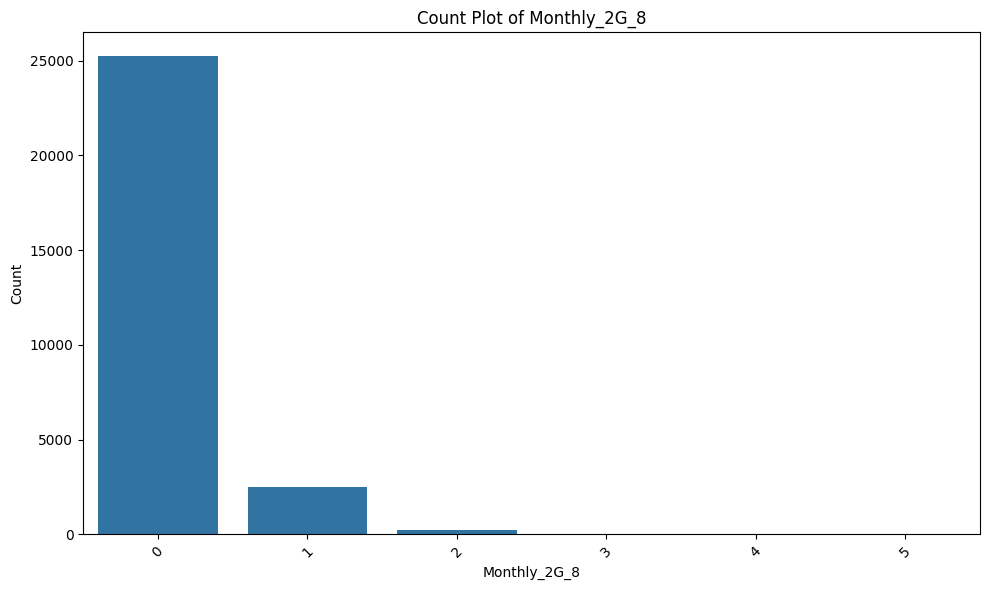


Percentage Distribution of monthly_3g_6
0    89.70
1     7.55
2     1.87
3     0.55
4     0.21
5     0.05
6     0.03
7     0.03
8     0.01
9     0.01
Name: count, dtype: float64


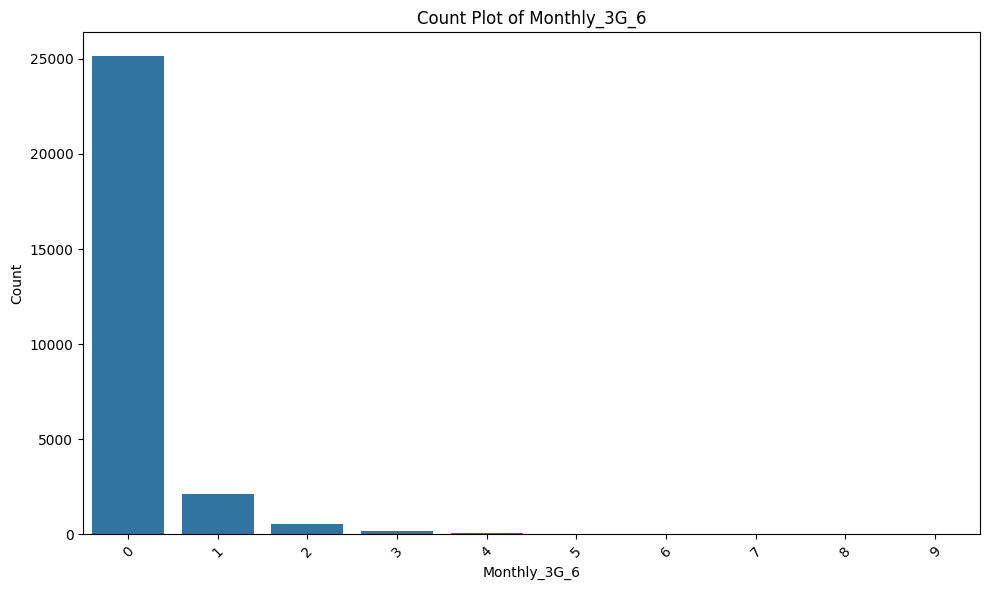


Percentage Distribution of monthly_3g_7
0     89.63
1      7.20
2      2.25
3      0.55
4      0.16
5      0.09
6      0.06
7      0.02
8      0.01
9      0.01
10     0.00
14     0.00
16     0.00
Name: count, dtype: float64


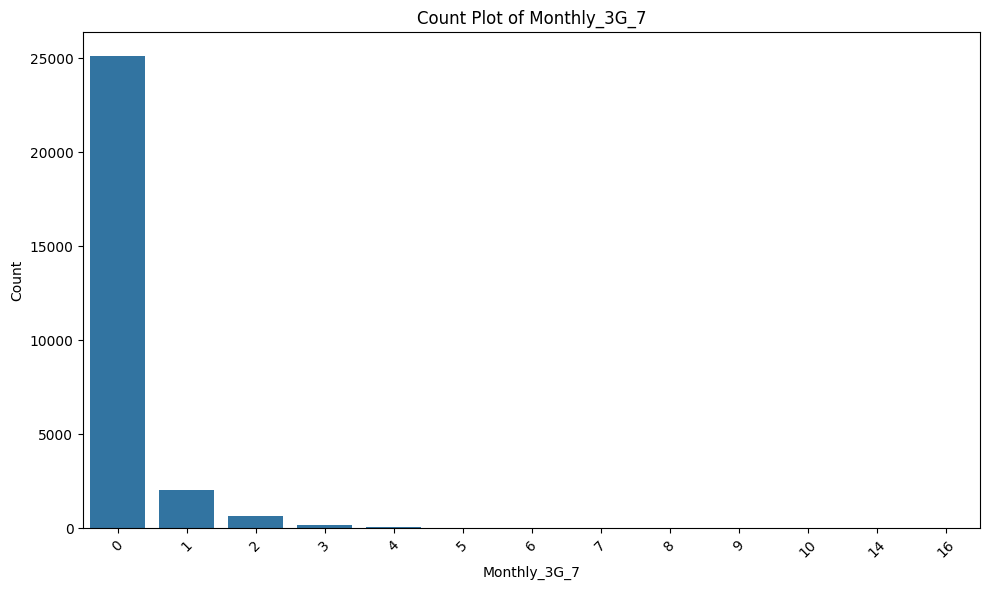


Percentage Distribution of monthly_3g_8
0     90.03
1      7.09
2      1.96
3      0.55
4      0.21
5      0.08
6      0.02
7      0.02
8      0.01
9      0.01
10     0.00
16     0.00
Name: count, dtype: float64


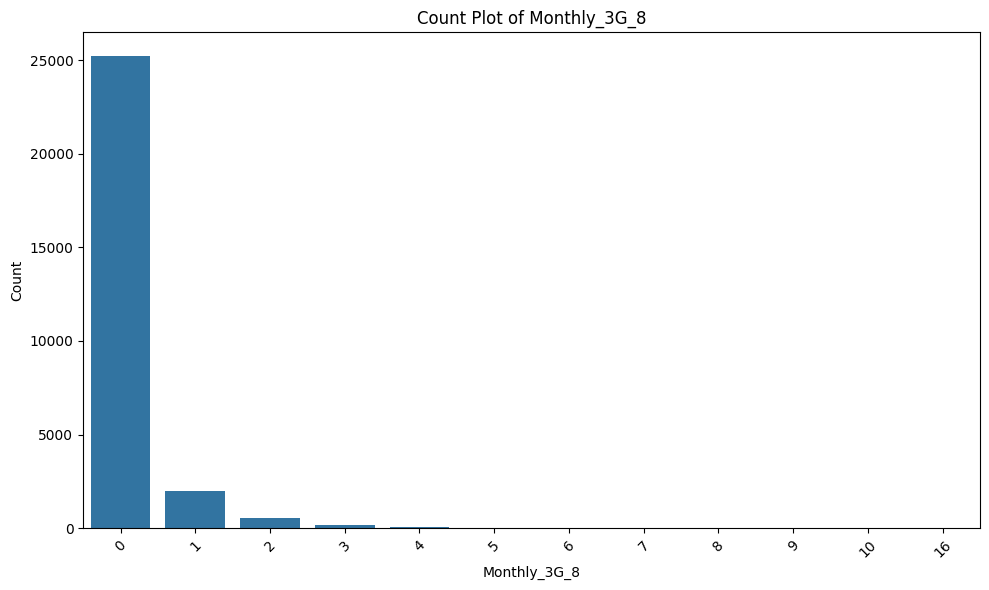

In [154]:
# Looping through all the categorical columns
for col in categorical_columns:
    # Calculating the percentage distribution
    print(f'\nPercentage Distribution of {np.round((high_val_train[col].value_counts() / high_val_train[col].value_counts().sum()) * 100,2)}')

    # Setting figure size
    plt.figure(figsize=(10,6))
    
    # Creating a count plot
    sns.countplot(x=high_val_train[col],order = high_val_train[col].value_counts().index)
    
    # Setting plot labels and title
    plt.title(f'Count Plot of {col.title()}')
    plt.xlabel(col.title())
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

**Observation**:
- Above plots help us visualize which packs opted more by the users.Pack 0 is more popular among users.

## Bivariate Analysis

### Categorical Variables By Target Variable 'churn_probability'

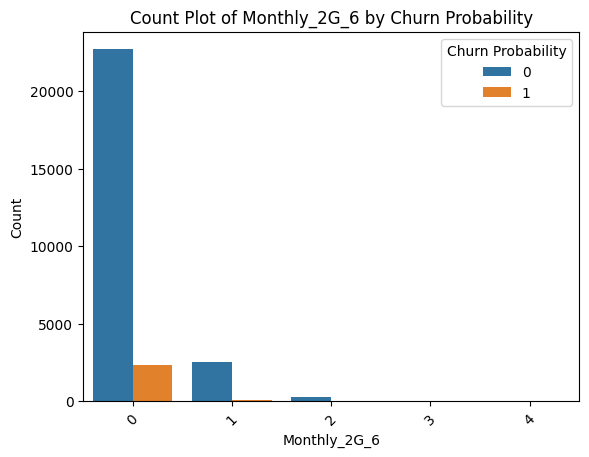

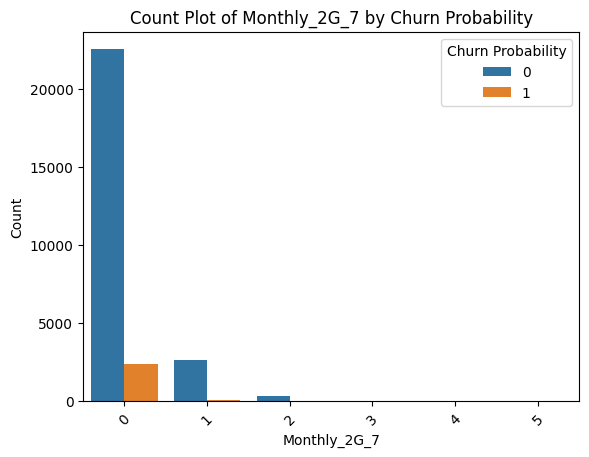

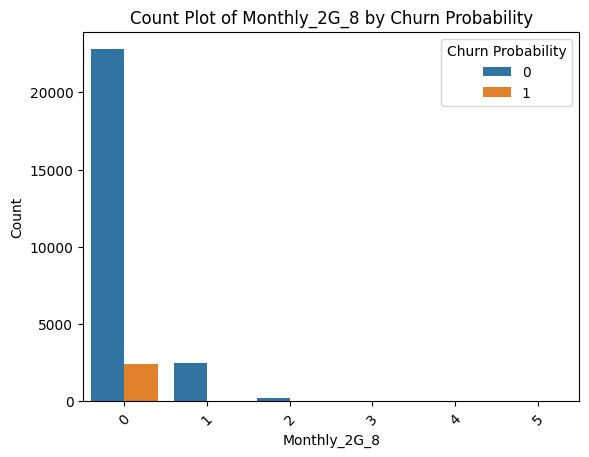

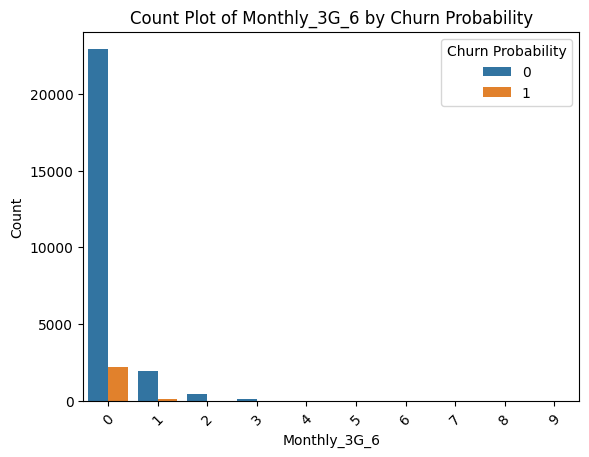

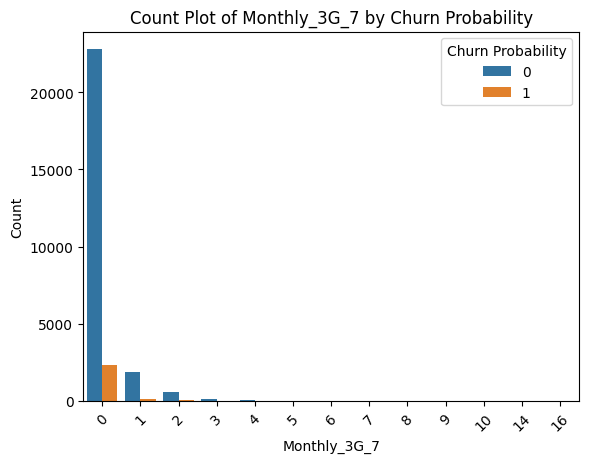

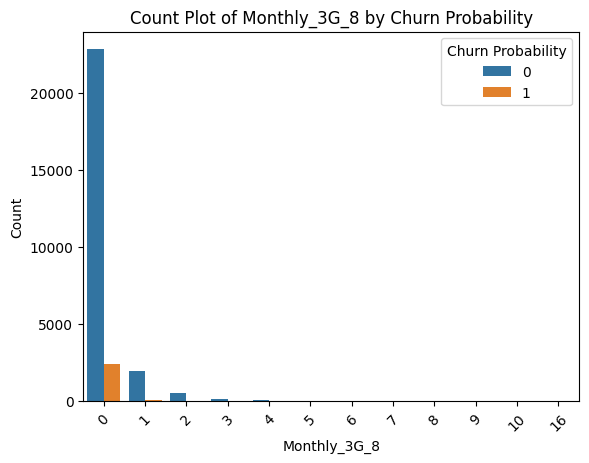

In [155]:
# Looping through each categorical column
for col in categorical_columns:
    # Plot countplot against 'churn_probability'
    sns.countplot(x=col, hue='churn_probability', data=high_val_train)
    plt.title(f'Count Plot of {col.title()} by Churn Probability')
    plt.xlabel(col.title())
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.legend(title='Churn Probability')
    plt.show()

### Bivariate Analysis of Derived Columns By Target Variable 'churn_probability'

In [156]:
# Get the derived month columns
diff_columns = [col for col in high_val_train.columns if '_diff' in col]

# Display the resulting list of column names
print(diff_columns)

['arpu_diff', 'onnet_mou_diff', 'offnet_mou_diff', 'roam_ic_mou_diff', 'roam_og_mou_diff', 'loc_og_t2t_mou_diff', 'loc_og_t2m_mou_diff', 'loc_og_t2f_mou_diff', 'loc_og_t2c_mou_diff', 'loc_og_mou_diff', 'std_og_t2t_mou_diff', 'std_og_t2m_mou_diff', 'std_og_t2f_mou_diff', 'std_og_mou_diff', 'isd_og_mou_diff', 'spl_og_mou_diff', 'og_others_diff', 'total_og_mou_diff', 'loc_ic_t2t_mou_diff', 'loc_ic_t2m_mou_diff', 'loc_ic_t2f_mou_diff', 'loc_ic_mou_diff', 'std_ic_t2t_mou_diff', 'std_ic_t2m_mou_diff', 'std_ic_t2f_mou_diff', 'std_ic_mou_diff', 'total_ic_mou_diff', 'spl_ic_mou_diff', 'isd_ic_mou_diff', 'ic_others_diff', 'total_rech_num_diff', 'total_rech_amt_diff', 'max_rech_amt_diff', 'total_rech_data_diff', 'max_rech_data_diff', 'count_rech_2g_diff', 'count_rech_3g_diff', 'av_rech_amt_data_diff', 'vol_2g_mb_diff', 'vol_3g_mb_diff', 'arpu_3g_diff', 'arpu_2g_diff', 'sachet_2g_diff', 'sachet_3g_diff']


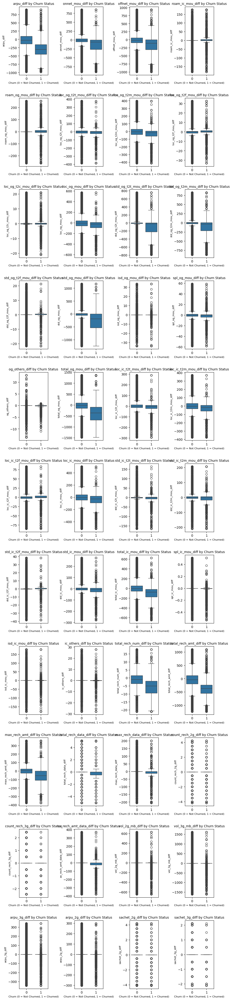

In [157]:
n_cols = 4 
n_rows = (len(diff_columns) + n_cols - 1) // n_cols  

# Set up the plot with a larger figure size
plt.figure(figsize=(10, n_rows * 4))  

# Iterate through each column in the list
for i, y_column in enumerate(diff_columns):
    plt.subplot(n_rows, n_cols, i + 1)  # Create a subplot for each column
    sns.boxplot(x='churn_probability', y=y_column, data=high_val_train)
    
    # Add titles and labels for each subplot
    plt.title(f'{y_column} by Churn Status', fontsize=10)
    plt.xlabel('Churn (0 = Not Churned, 1 = Churned)', fontsize=8)
    plt.ylabel(y_column, fontsize=8)

# Adjust layout to prevent overlap
plt.tight_layout(pad=3.0)

# Show the plot
plt.show()

## Multivariate Analysis

In [158]:
print(numerical_columns)

['arpu_6', 'arpu_7', 'arpu_8', 'onnet_mou_6', 'onnet_mou_7', 'onnet_mou_8', 'offnet_mou_6', 'offnet_mou_7', 'offnet_mou_8', 'roam_ic_mou_6', 'roam_ic_mou_7', 'roam_ic_mou_8', 'roam_og_mou_6', 'roam_og_mou_7', 'roam_og_mou_8', 'loc_og_t2t_mou_6', 'loc_og_t2t_mou_7', 'loc_og_t2t_mou_8', 'loc_og_t2m_mou_6', 'loc_og_t2m_mou_7', 'loc_og_t2m_mou_8', 'loc_og_t2f_mou_6', 'loc_og_t2f_mou_7', 'loc_og_t2f_mou_8', 'loc_og_t2c_mou_6', 'loc_og_t2c_mou_7', 'loc_og_t2c_mou_8', 'loc_og_mou_6', 'loc_og_mou_7', 'loc_og_mou_8', 'std_og_t2t_mou_6', 'std_og_t2t_mou_7', 'std_og_t2t_mou_8', 'std_og_t2m_mou_6', 'std_og_t2m_mou_7', 'std_og_t2m_mou_8', 'std_og_t2f_mou_6', 'std_og_t2f_mou_7', 'std_og_t2f_mou_8', 'std_og_mou_6', 'std_og_mou_7', 'std_og_mou_8', 'isd_og_mou_6', 'isd_og_mou_7', 'isd_og_mou_8', 'spl_og_mou_6', 'spl_og_mou_7', 'spl_og_mou_8', 'og_others_6', 'og_others_7', 'og_others_8', 'total_og_mou_6', 'total_og_mou_7', 'total_og_mou_8', 'loc_ic_t2t_mou_6', 'loc_ic_t2t_mou_7', 'loc_ic_t2t_mou_8', 'lo

As the number of numerical columns is huge, we will filter the similar columns to plot heat map .

In [159]:
# List of filtered columns
amount_columns = high_val_train[numerical_columns].filter(regex=re.compile(r'amt'))
rech_columns = high_val_train[numerical_columns].filter(regex=re.compile(r'rech'))
total_columns = high_val_train[numerical_columns].filter(regex=re.compile(r'tot'))
data2g_columns = high_val_train[numerical_columns].filter(regex=re.compile(r'2g'))
data3g_columns = high_val_train[numerical_columns].filter(regex=re.compile(r'3g'))
ic_mou_columns = high_val_train[numerical_columns].filter(regex=re.compile(r'ic.*mou'))
net_mou_columns = high_val_train[numerical_columns].filter(regex=re.compile(r'net_mou'))
og_mou_columns = high_val_train[numerical_columns].filter(regex=re.compile(r'og.*mou'))

In [160]:
len(amount_columns.columns)

16

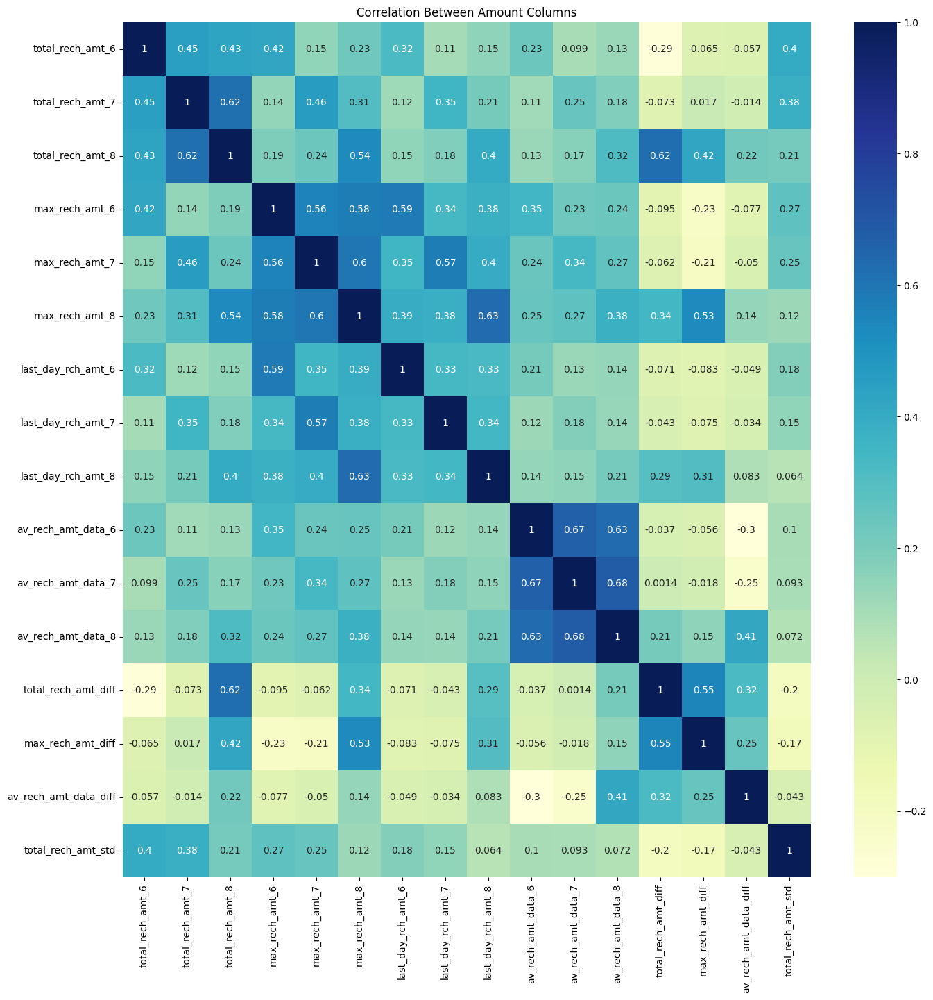

In [161]:
# Amount Columns
plt.figure(figsize=(len(amount_columns.columns), len(amount_columns.columns)))
sns.heatmap(amount_columns.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Between Amount Columns')
plt.show()

**Observation**:
-  There is a strong correlation between avg_rech_amt_data_8 and avg_rech_amt_data_7, indicating that customers who had higher recharge amounts in both Month 7 and Month 8 are less likely to churn.

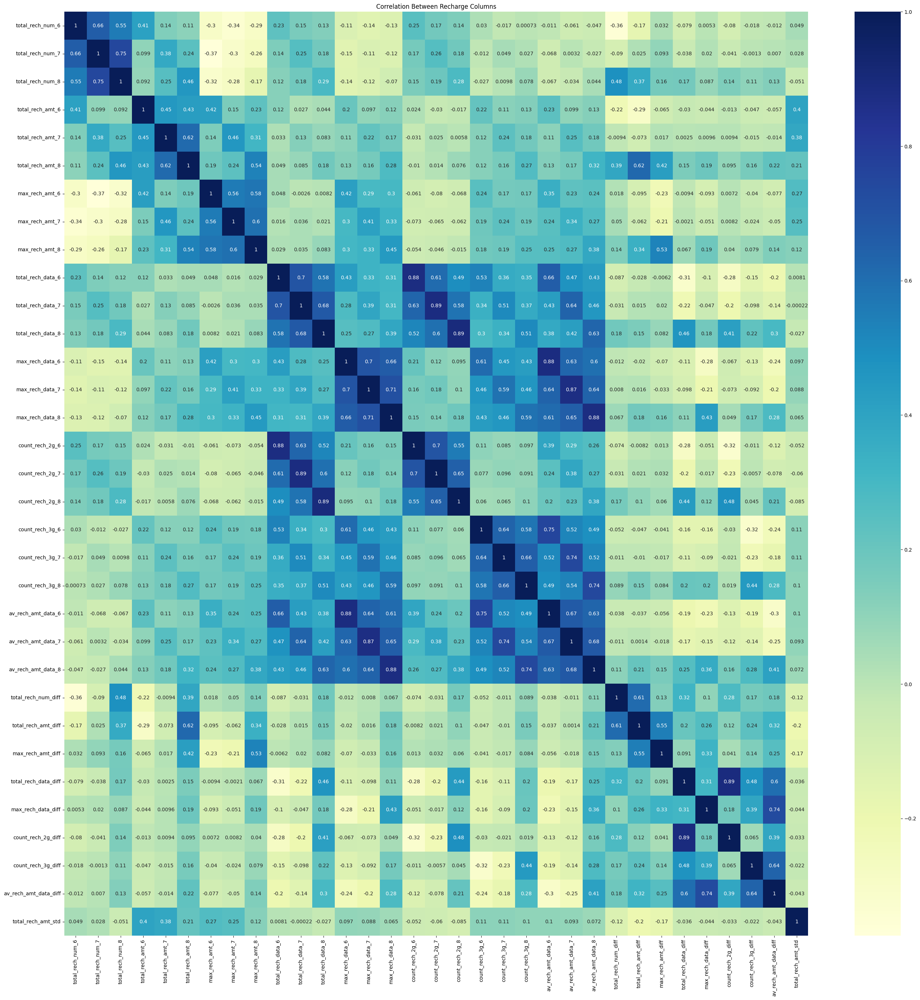

In [162]:
# Recharge Columns
plt.figure(figsize=(len(rech_columns.columns), len(rech_columns.columns)))
sns.heatmap(rech_columns.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Between Recharge Columns')
plt.show()

**Observation**:
-  total_rech_num_7 and total_rech_num_8 have good correlation of 0.75

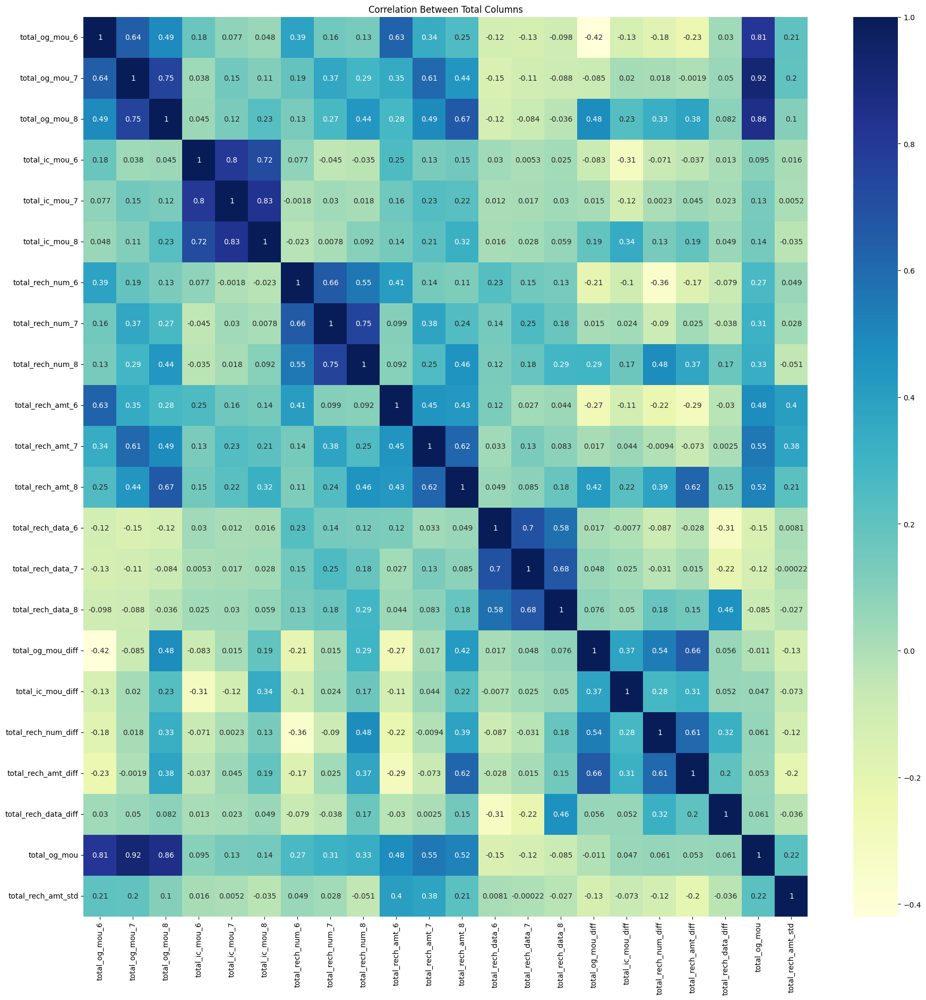

In [163]:
# Total Columns
plt.figure(figsize=(len(total_columns.columns), len(total_columns.columns)))
sns.heatmap(total_columns.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Between Total Columns')
plt.show()

**Observation**:
-  total_og_mou_7 and total_og_mou_8 have high correlation of 0.92. Indicating these customers with high usage are unlikely to churn.

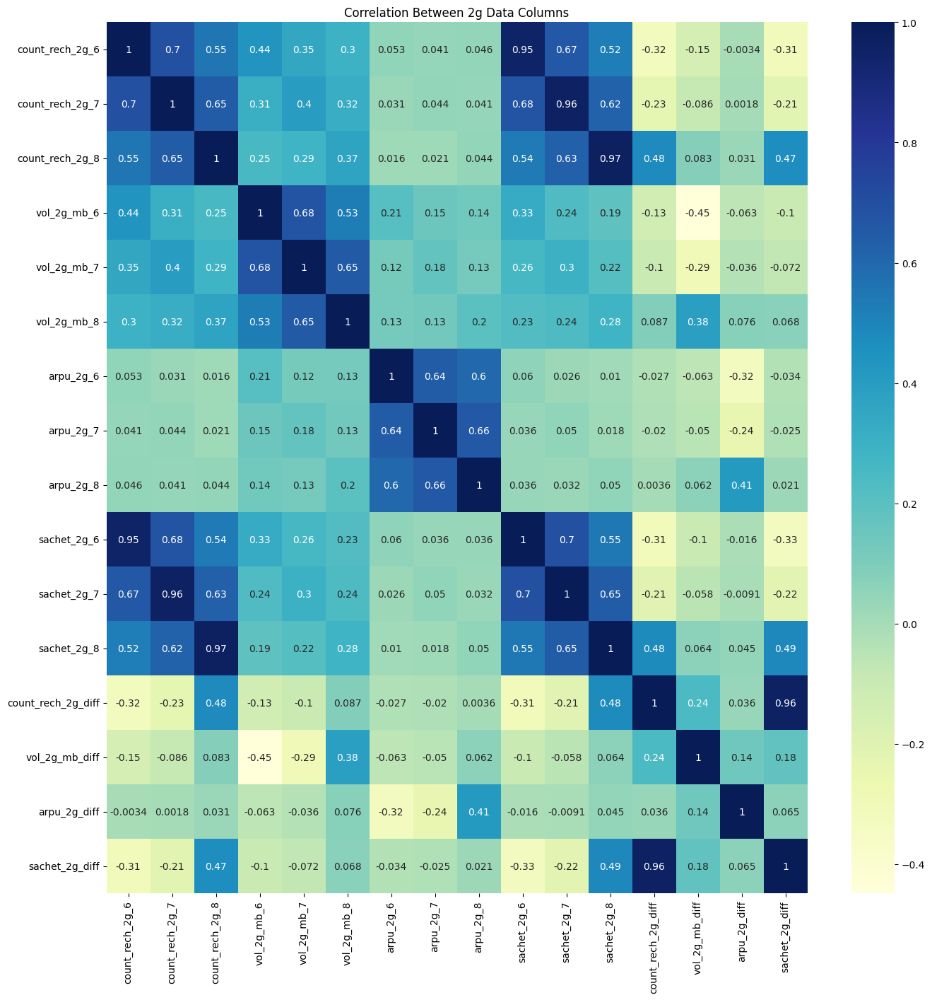

In [164]:
# 2G Data Columns
plt.figure(figsize=(len(data2g_columns.columns), len(data2g_columns.columns)))
sns.heatmap(data2g_columns.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Between 2g Data Columns')
plt.show()

**Observations:**
- Very strong correlation between 2G data columns in months 7 and 8.

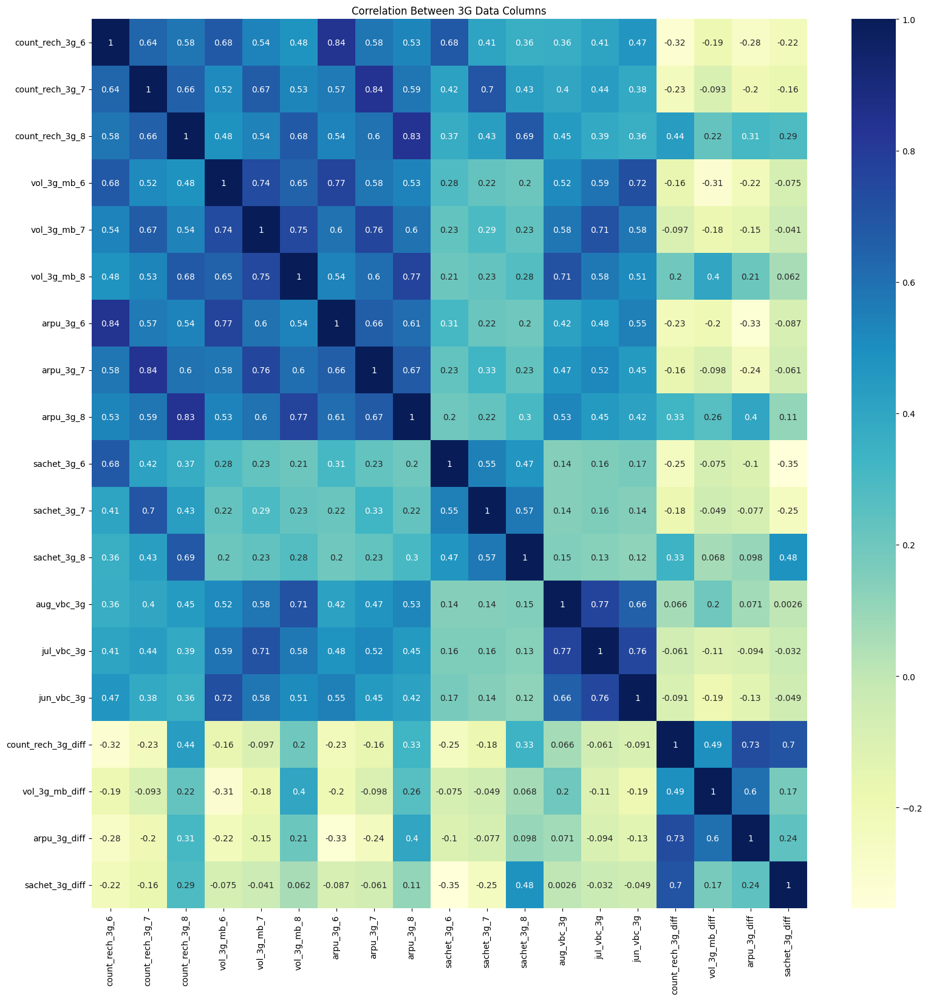

In [165]:
# 3G Data Columns
plt.figure(figsize=(len(data3g_columns.columns), len(data3g_columns.columns)))
sns.heatmap(data3g_columns.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Between 3G Data Columns')
plt.show()

**Observations:**
The below columns show  high correlation:
1. count_rech_3g_6 and arpu_3g_6
2. count_rech_3g_7 and arpu_3g_7
3. count_rech_3g_8 and arpu_3g_8

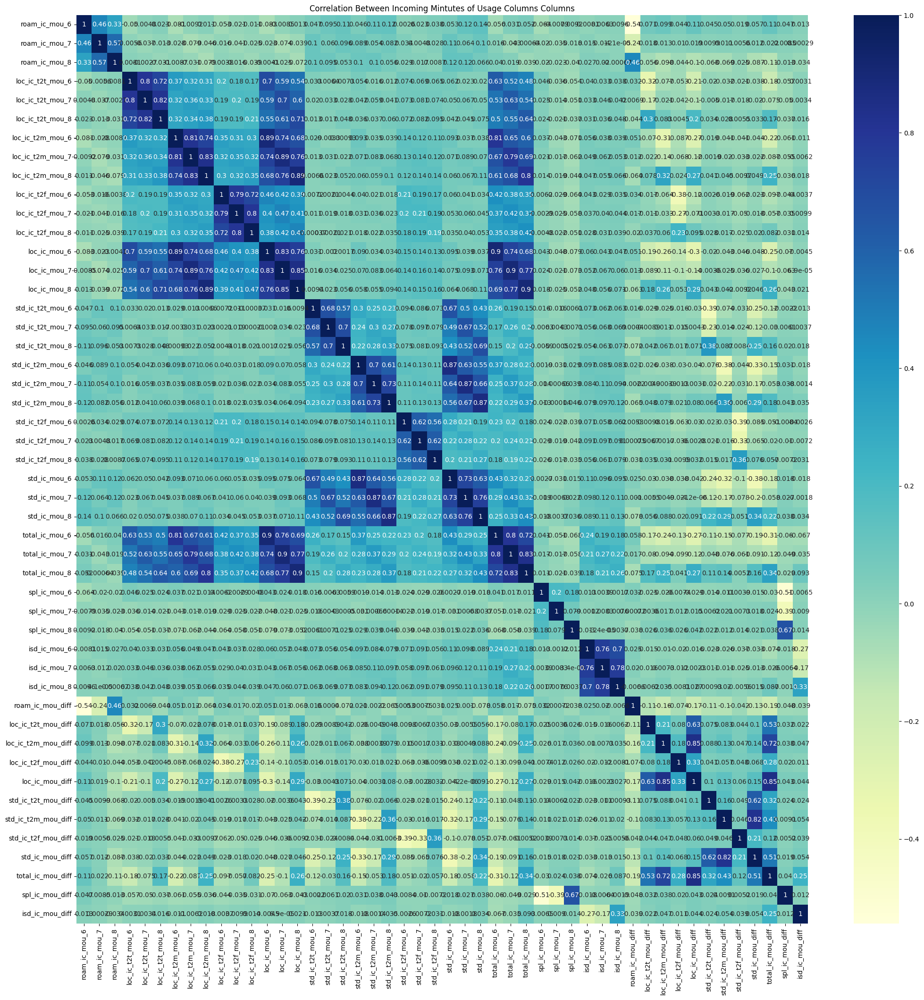

In [166]:
# Incoming Mintutes of Usage Columns
plt.figure(figsize=(25, 25))
sns.heatmap(ic_mou_columns.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Between Incoming Mintutes of Usage Columns Columns')
plt.show()

**Observations:**
The below columns show  high correlation:
 - total_ic_mou_6 and loc_ic_mou_6
 -  total_ic_mou_7 and loc_ic_mou_7
 -  total_ic_mou_8 and loc_ic_mou_8
 -  std_ic_mou_6 and std_ic_t2f_mou_6
 -  std_ic_mou_7 and std_ic_t2f_mou_7
 -  std_ic_mou_8 and std_ic_t2f_mou_8

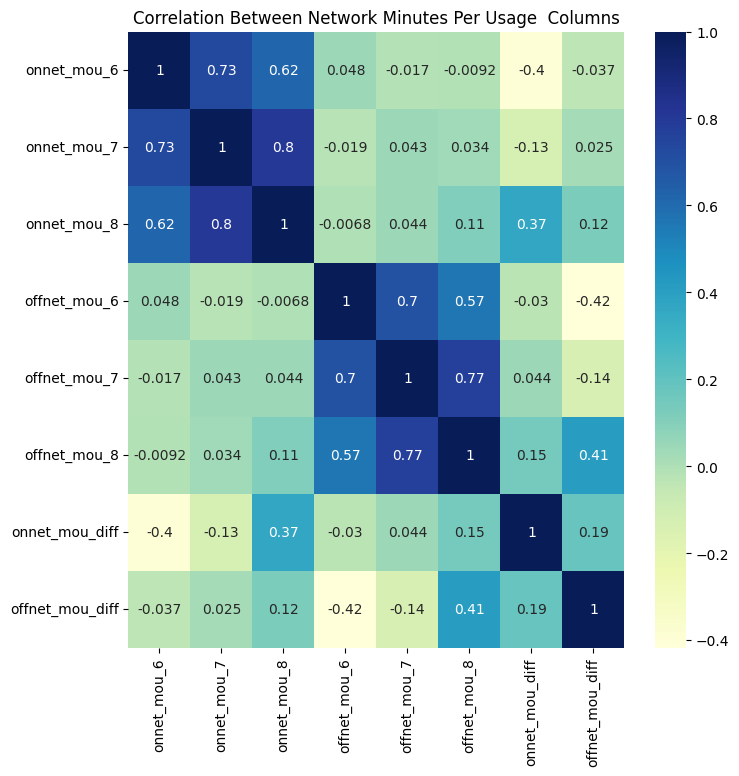

In [167]:
# Network Minutes Per Usage Columns
plt.figure(figsize=(len(net_mou_columns.columns), len(net_mou_columns.columns)))
sns.heatmap(net_mou_columns.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Between Network Minutes Per Usage  Columns')
plt.show()

**Observation**:
-  No correlation between Off Net Minutes of Usage and On Net Minutes of Usage

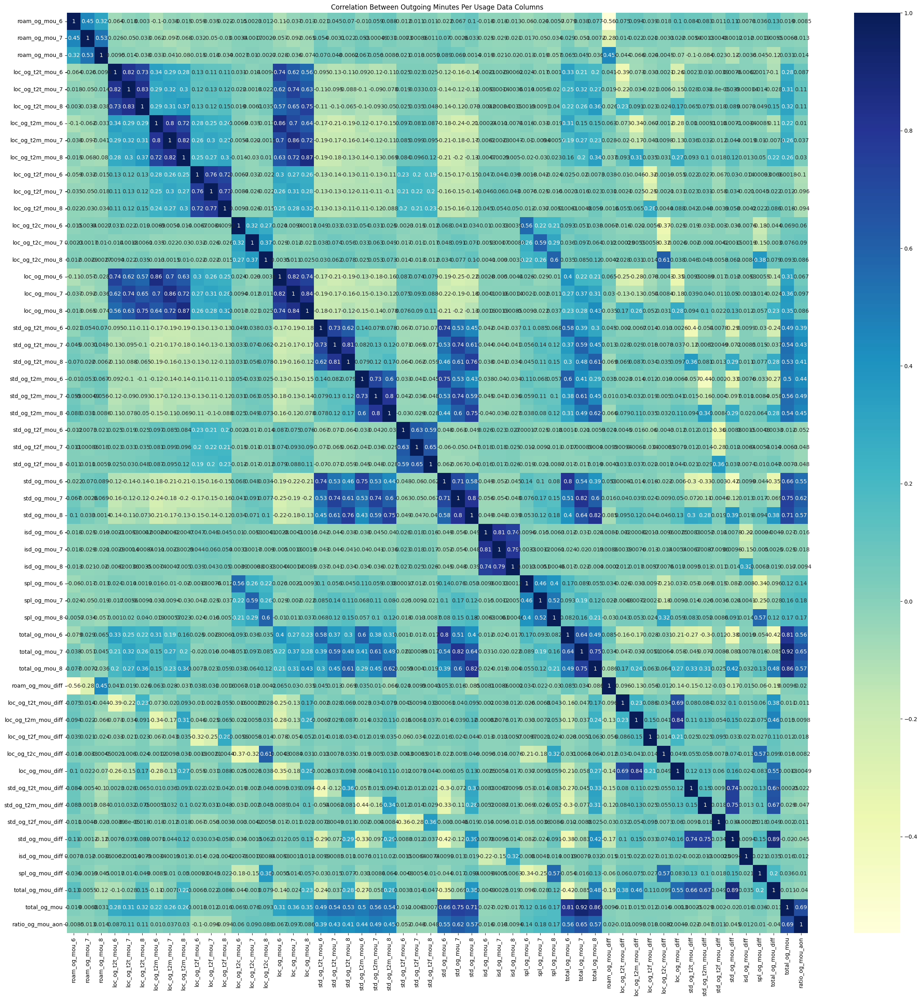

In [168]:
# OutGoing Minutes Per Usage Columns
plt.figure(figsize=(30,30))
sns.heatmap(og_mou_columns.corr(), annot=True, cmap='YlGnBu')
plt.title('Correlation Between Outgoing Minutes Per Usage Data Columns')
plt.show()

***Observations:***
- There exists a very high correlation between the following variables/features:
   -  total_og_mou_6 and std_og_mou_6
   -  total_og_mou_7 and std_og_mou_7
   - total_og_mou_8 and std_og_mou_8
   - isd_og_mou_7 and isd_og_mou_6
   - isd_og_mou_8 and isd_og_mou_6
   - isd_og_mou_8 and isd_og_mou_7

# 7. Data Preprocessing

In [169]:
# Get the categorical_columns
categorical_columns = [col for col in high_val_train.columns if high_val_train[col].dtype.name == 'category']
high_val_train[categorical_columns] = high_val_train[categorical_columns].apply(lambda x: x.astype(int))
test[categorical_columns] = test[categorical_columns].apply(lambda x: x.astype(int))


In [170]:
# Printing the shape of the train and test set
high_val_train.shape, test.shape

((28019, 196), (30000, 196))

# 8. Train test split

In [171]:
# Spliting the data
X = high_val_train.drop(['churn_probability'], axis=1)
y = high_val_train['churn_probability']

X.shape, y.shape

((28019, 195), (28019,))

In [172]:
X.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,day_date_of_last_rech_6,day_date_of_last_rech_7,day_date_of_last_rech_8,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_t2t_mou_diff,loc_og_t2m_mou_diff,loc_og_t2f_mou_diff,loc_og_t2c_mou_diff,loc_og_mou_diff,std_og_t2t_mou_diff,std_og_t2m_mou_diff,std_og_t2f_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,og_others_diff,total_og_mou_diff,loc_ic_t2t_mou_diff,loc_ic_t2m_mou_diff,loc_ic_t2f_mou_diff,loc_ic_mou_diff,std_ic_t2t_mou_diff,std_ic_t2m_mou_diff,std_ic_t2f_mou_diff,std_ic_mou_diff,total_ic_mou_diff,spl_ic_mou_diff,isd_ic_mou_diff,ic_others_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,count_rech_2g_diff,count_rech_3g_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,arpu_3g_diff,arpu_2g_diff,sachet_2g_diff,sachet_3g_diff,total_og_mou,ratio_og_mou_aon,total_rech_amt_std
0,292.724,228.753,418.233,135.54,63.61,177.36,46.39,65.48,92.81,0.00,0.0,0.0,0.00,0.0,0.0,86.39,27.59,82.33,43.28,29.49,83.54,0.58,0.36,0.00,2.53,0.0,0.0,130.26,57.46,165.88,49.14,36.01,95.03,0.00,35.61,9.26,0.0,0.00,0.00,49.14,71.63,104.29,0.0,0.0,0.0,2.53,0.0,0.35,0.00,0.0,0.0,181.94,129.09,270.53,66.34,62.03,115.13,60.46,45.2300,61.26,0.38,0.00,0.41,127.19,107.26,176.81,6.73,44.76,86.19,0.00,2.65,18.96,0.00,0.00,0.00,6.73,47.41,105.16,133.93,154.68,281.98,0.00,0.0,0.0,0.0,0.0,0.0,0.00,0.00,0.00,10.0,6.0,8.0,410.0,220.0,460.0,110.0,50.0,130.0,110.0,50.0,50.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.00,0.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0,0,0,0.0,0.0,0.0,0,0,0,0.0,0.0,0.0,648.0,0.0,0.0,0.0,28,31,27,157.4945,77.785,36.875,0.00,0.000,25.340,47.155,-0.470,-1.265,72.020,52.455,-8.545,0.000,43.905,0.0,-0.915,0.000,115.015,50.945000,8.415,0.220,59.585,60.445,17.635,0.000,78.090,137.675,0.000,0.0,0.00,0.0,145.0,50.0,0.0,0.0,0.0,0.0,0.0,0.00,0.0,0.0,0.000,0.0,0.0,581.56,

In [173]:
y.head()

0    0
1    0
2    0
3    0
4    0
Name: churn_probability, dtype: int64

Splitting train and test data to avoid any contamination of the test data

In [174]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2,random_state=42)

X_train.shape, X_test.shape, y_train.shape, y_test.shape

((22415, 195), (5604, 195), (22415,), (5604,))

In [175]:
X_train.head()

,arpu_6,arpu_7,arpu_8,onnet_mou_6,onnet_mou_7,onnet_mou_8,offnet_mou_6,offnet_mou_7,offnet_mou_8,roam_ic_mou_6,roam_ic_mou_7,roam_ic_mou_8,roam_og_mou_6,roam_og_mou_7,roam_og_mou_8,loc_og_t2t_mou_6,loc_og_t2t_mou_7,loc_og_t2t_mou_8,loc_og_t2m_mou_6,loc_og_t2m_mou_7,loc_og_t2m_mou_8,loc_og_t2f_mou_6,loc_og_t2f_mou_7,loc_og_t2f_mou_8,loc_og_t2c_mou_6,loc_og_t2c_mou_7,loc_og_t2c_mou_8,loc_og_mou_6,loc_og_mou_7,loc_og_mou_8,std_og_t2t_mou_6,std_og_t2t_mou_7,std_og_t2t_mou_8,std_og_t2m_mou_6,std_og_t2m_mou_7,std_og_t2m_mou_8,std_og_t2f_mou_6,std_og_t2f_mou_7,std_og_t2f_mou_8,std_og_mou_6,std_og_mou_7,std_og_mou_8,isd_og_mou_6,isd_og_mou_7,isd_og_mou_8,spl_og_mou_6,spl_og_mou_7,spl_og_mou_8,og_others_6,og_others_7,og_others_8,total_og_mou_6,total_og_mou_7,total_og_mou_8,loc_ic_t2t_mou_6,loc_ic_t2t_mou_7,loc_ic_t2t_mou_8,loc_ic_t2m_mou_6,loc_ic_t2m_mou_7,loc_ic_t2m_mou_8,loc_ic_t2f_mou_6,loc_ic_t2f_mou_7,loc_ic_t2f_mou_8,loc_ic_mou_6,loc_ic_mou_7,loc_ic_mou_8,std_ic_t2t_mou_6,std_ic_t2t_mou_7,std_ic_t2t_mou_8,std_ic_t2m_mou_6,std_ic_t2m_mou_7,std_ic_t2m_mou_8,std_ic_t2f_mou_6,std_ic_t2f_mou_7,std_ic_t2f_mou_8,std_ic_mou_6,std_ic_mou_7,std_ic_mou_8,total_ic_mou_6,total_ic_mou_7,total_ic_mou_8,spl_ic_mou_6,spl_ic_mou_7,spl_ic_mou_8,isd_ic_mou_6,isd_ic_mou_7,isd_ic_mou_8,ic_others_6,ic_others_7,ic_others_8,total_rech_num_6,total_rech_num_7,total_rech_num_8,total_rech_amt_6,total_rech_amt_7,total_rech_amt_8,max_rech_amt_6,max_rech_amt_7,max_rech_amt_8,last_day_rch_amt_6,last_day_rch_amt_7,last_day_rch_amt_8,total_rech_data_6,total_rech_data_7,total_rech_data_8,max_rech_data_6,max_rech_data_7,max_rech_data_8,count_rech_2g_6,count_rech_2g_7,count_rech_2g_8,count_rech_3g_6,count_rech_3g_7,count_rech_3g_8,av_rech_amt_data_6,av_rech_amt_data_7,av_rech_amt_data_8,vol_2g_mb_6,vol_2g_mb_7,vol_2g_mb_8,vol_3g_mb_6,vol_3g_mb_7,vol_3g_mb_8,arpu_3g_6,arpu_3g_7,arpu_3g_8,arpu_2g_6,arpu_2g_7,arpu_2g_8,monthly_2g_6,monthly_2g_7,monthly_2g_8,sachet_2g_6,sachet_2g_7,sachet_2g_8,monthly_3g_6,monthly_3g_7,monthly_3g_8,sachet_3g_6,sachet_3g_7,sachet_3g_8,aon,aug_vbc_3g,jul_vbc_3g,jun_vbc_3g,day_date_of_last_rech_6,day_date_of_last_rech_7,day_date_of_last_rech_8,arpu_diff,onnet_mou_diff,offnet_mou_diff,roam_ic_mou_diff,roam_og_mou_diff,loc_og_t2t_mou_diff,loc_og_t2m_mou_diff,loc_og_t2f_mou_diff,loc_og_t2c_mou_diff,loc_og_mou_diff,std_og_t2t_mou_diff,std_og_t2m_mou_diff,std_og_t2f_mou_diff,std_og_mou_diff,isd_og_mou_diff,spl_og_mou_diff,og_others_diff,total_og_mou_diff,loc_ic_t2t_mou_diff,loc_ic_t2m_mou_diff,loc_ic_t2f_mou_diff,loc_ic_mou_diff,std_ic_t2t_mou_diff,std_ic_t2m_mou_diff,std_ic_t2f_mou_diff,std_ic_mou_diff,total_ic_mou_diff,spl_ic_mou_diff,isd_ic_mou_diff,ic_others_diff,total_rech_num_diff,total_rech_amt_diff,max_rech_amt_diff,total_rech_data_diff,max_rech_data_diff,count_rech_2g_diff,count_rech_3g_diff,av_rech_amt_data_diff,vol_2g_mb_diff,vol_3g_mb_diff,arpu_3g_diff,arpu_2g_diff,sachet_2g_diff,sachet_3g_diff,total_og_mou,ratio_og_mou_aon,total_rech_amt_std
2789,900.510,780.384000,637.974,781.94,542.24,571.980000,181.14,377.28,190.19000,230.606236,9.05,0.00000,350.552698,1.56,0.000000,89.49,361.83,408.660000,34.73,158.49,127.790000,0.0,3.46,0.000000,0.00,2.06,1.350000,124.23,523.79,536.460000,210.64,179.03,163.310000,19.11,213.06,61.460000,0.00,0.00,0.000000,229.76,392.09,224.780000,0.00,0.00,0.000000,0.10,5.38,6.690000,1.36,0.0,0.000000,355.46,921.28,767.94,36.83,66.04,57.510000,99.96,318.44,398.340000,8.11,10.86,17.41000,144.91,395.36,473.280000,56.030000,46.56,38.760000,17.260000,136.49,62.290000,0.000000,0.00,3.360000,73.290000,183.06,104.430000,218.480000,579.240000,579.09,0.26,0.08,0.000000,0.00000,0.000000,0.150000,0.000000,0.73,1.230000,21.0,16.0,8.0,1056.0,866.000000,780.0,110.000000,110.000000,130.00000,100.000000,110.000000,50.000000,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.00,0.00,0.00,0.000000,0.00000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0,0,0,0.0,0.0,0.0,0,0,0

# 9. Handle Class Imbalance
Handling class imbalance using SMOTE

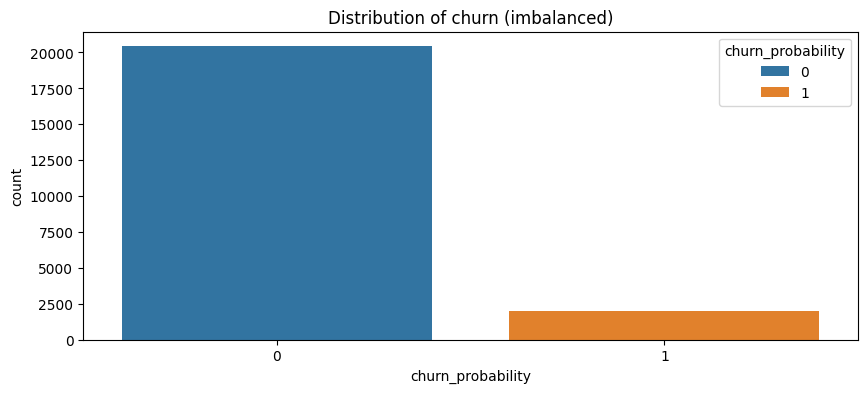

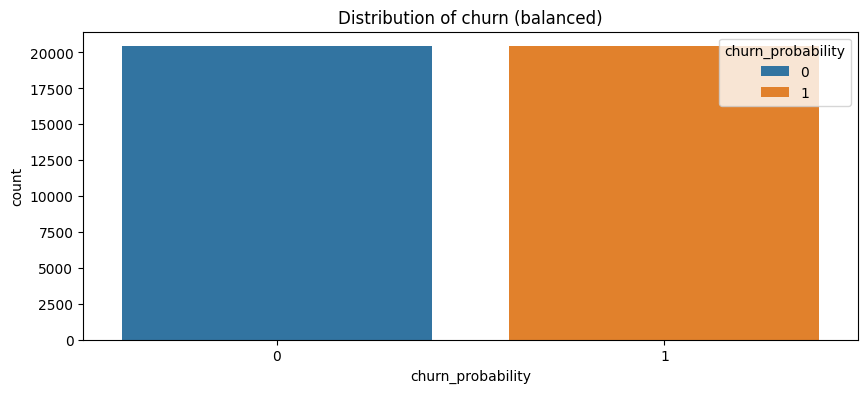

In [176]:
# Instantiate SMOTE
smote = SMOTE(random_state=42)

# Fittign SMOTE to the train set
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Checking the distribution on our target variable 'y_train' before SMOTE
plt.figure(figsize=(10, 4))
plt.title("Distribution of churn (imbalanced)")
sns.countplot(x=y_train, hue=y_train)

plt.subplots_adjust(wspace=0.8)
plt.show()

# Checking the distribution on our target variable 'y_train' after SMOTE
plt.figure(figsize=(10, 4))
plt.title("Distribution of churn (balanced)")
sns.countplot(x=y_train_smote, hue=y_train_smote)

plt.subplots_adjust(wspace=0.8)
plt.show()

# 10. Model Building

### Utility Methods

In [177]:
def evaluate_model(y_true, y_pred):
    # Calculate metrics
    accuracy = accuracy_score(y_true, y_pred)
    precision = precision_score(y_true, y_pred)
    recall = recall_score(y_true, y_pred)
    f1 = f1_score(y_true, y_pred)

    # Display metrics
    print("Accuracy:", accuracy)
    print("Precision:", precision)
    print("Recall:", recall)
    print("F1 Score:", f1)

    # Confusion Matrix
    conf_matrix = confusion_matrix(y_true, y_pred)
    print("\nConfusion Matrix:")
    print(conf_matrix)
    
    # Classification Report
    print("\nClassification Report:")
    print(classification_report(y_true, y_pred))

In [178]:
def plot_precision_recall_curve(y_true, y_pred_proba):
    precision, recall, _ = precision_recall_curve(y_true, y_pred_proba)
    
    plt.figure(figsize=(8, 6))
    plt.plot(recall, precision, marker='o')
    plt.xlabel('Recall', fontsize=12)
    plt.ylabel('Precision', fontsize=12)
    plt.title('Precision-Recall Curve', fontsize=14)
    plt.grid()
    plt.show()

In [179]:
def plot_roc_curve(y_true, y_pred_proba):
    fpr, tpr, _ = roc_curve(y_true, y_pred_proba)
    roc_auc = auc(fpr, tpr)

    plt.figure(figsize=(8, 6))
    plt.plot(fpr, tpr, label=f'ROC curve (area = {roc_auc:.2f})')
    plt.plot([0, 1], [0, 1], linestyle='--')  # Diagonal line
    plt.xlabel('False Positive Rate', fontsize=12)
    plt.ylabel('True Positive Rate', fontsize=12)
    plt.title('Receiver Operating Characteristic (ROC) Curve', fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()

## PCA

In [180]:
# PCA fitting
pca = PCA(random_state=42)
pca.fit(X_train_smote)
var_cumu = np.cumsum(pca.explained_variance_ratio_)

# Get the number of components that explain 95% of the variance
num_components_95_variance = np.argmax(var_cumu >= 0.95) + 1 
print(f"Number of components explaining 95% of the variance: {num_components_95_variance}")


Number of components explaining 95% of the variance: 19


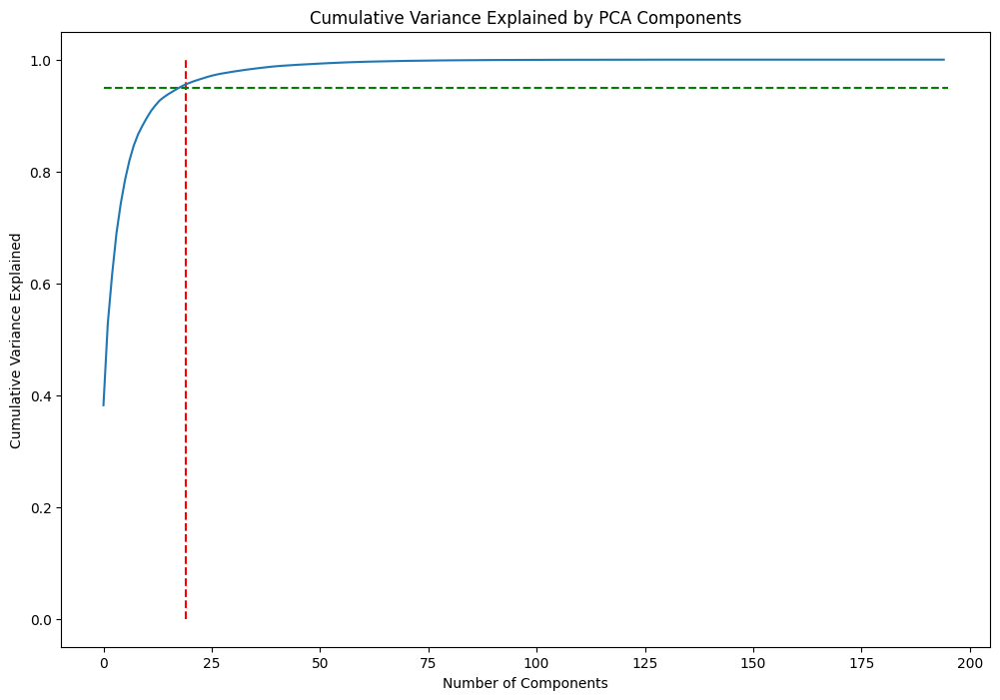

In [181]:
# Visualization
fig = plt.figure(figsize=[12, 8])
plt.vlines(x=num_components_95_variance, ymax=1, ymin=0, colors="r", linestyles="--")
plt.hlines(y=0.95, xmax=len(var_cumu), xmin=0, colors="g", linestyles="--")
plt.plot(var_cumu)
plt.title("Cumulative Variance Explained by PCA Components")
plt.xlabel("Number of Components")
plt.ylabel("Cumulative Variance Explained")
plt.show()

## Logistic Regression After PCA
To reduces the number of dimensions in  datasets to principal components so that most of the original information is retained.


--- Training Set Evaluation of Logistic Regression After PCA ---
Accuracy: 0.8189072750416136
Precision: 0.8038529713592686
Recall: 0.8436796240086165
F1 Score: 0.8232849226065354

Confusion Matrix:
[[16221  4205]
 [ 3193 17233]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.79      0.81     20426
           1       0.80      0.84      0.82     20426

    accuracy                           0.82     40852
   macro avg       0.82      0.82      0.82     40852
weighted avg       0.82      0.82      0.82     40852


--- Test Set Evaluation of Logistic Regression After PCA---
Accuracy: 0.7905067808708066
Precision: 0.2712090848363393
Recall: 0.8302658486707567
F1 Score: 0.40886203423967776

Confusion Matrix:
[[4024 1091]
 [  83  406]]

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.79      0.87      5115
           1       0.27      0.83      0.41       489

    acc

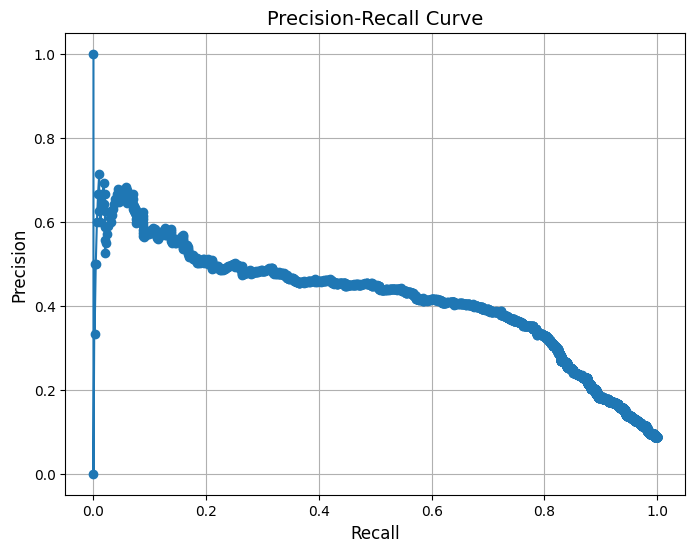

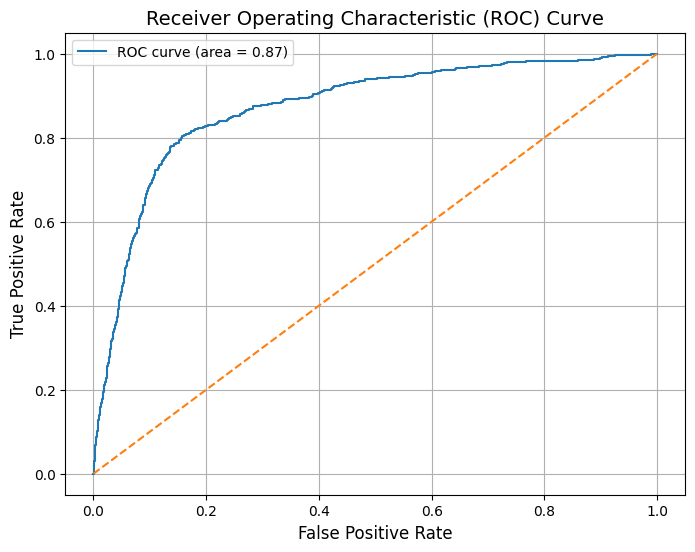

In [182]:
# Applying PCA to reduce dimensions
pca_final = IncrementalPCA(n_components=num_components_95_variance)

logreg = LogisticRegression(max_iter=500, tol=0.001, solver='sag', random_state=42)
scaler = StandardScaler()

# Define a pipeline
pipeline_pca = Pipeline(steps=[
    ('scaler', scaler),
    ('pca', pca_final),  
    ('logreg',logreg)  
])
# Fitting the pipeline on the training data
pipeline_pca.fit(X_train_smote, y_train_smote)

# Make predictions on the test data
y_pred_train = pipeline_pca.predict(X_train_smote)
y_pred_test = pipeline_pca.predict(X_test)

# Evaluate the model on the training set
print("\n--- Training Set Evaluation of Logistic Regression After PCA ---")
evaluate_model(y_train_smote, y_pred_train)

# Evaluate the model on the test set
print("\n--- Test Set Evaluation of Logistic Regression After PCA---")
evaluate_model(y_test, y_pred_test)

# Get predicted probabilities for ROC and Precision-Recall curves
y_pred_proba_test = pipeline_pca.predict_proba(X_test)[:, 1]

# Plot Precision-Recall Curve
plot_precision_recall_curve(y_test, y_pred_proba_test)

# Plot ROC Curve
plot_roc_curve(y_test, y_pred_proba_test)

### Hyperparamter Tuning With StratifiedKFold cross-validation


 Best Hyperparameters: {'pca__n_components': 19, 'log_reg__solver': 'lbfgs', 'log_reg__C': 0.046415888336127774}

-- Train Set Evaluation of Logistic Regression After PCA With Hyperparamter Tuning With StratifiedKFold cross-validation --
Accuracy: 0.8189072750416136
Precision: 0.8038813211420041
Recall: 0.8436306667972192
F1 Score: 0.823276479862405

Confusion Matrix:
[[16222  4204]
 [ 3194 17232]]

Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.79      0.81     20426
           1       0.80      0.84      0.82     20426

    accuracy                           0.82     40852
   macro avg       0.82      0.82      0.82     40852
weighted avg       0.82      0.82      0.82     40852


-- Test Set Evaluation of Logistic Regression After PCA With Hyperparamter Tuning With StratifiedKFold cross-validation --
Accuracy: 0.7905067808708066
Precision: 0.2712090848363393
Recall: 0.8302658486707567
F1 Score: 0.40886203423967776

Confu

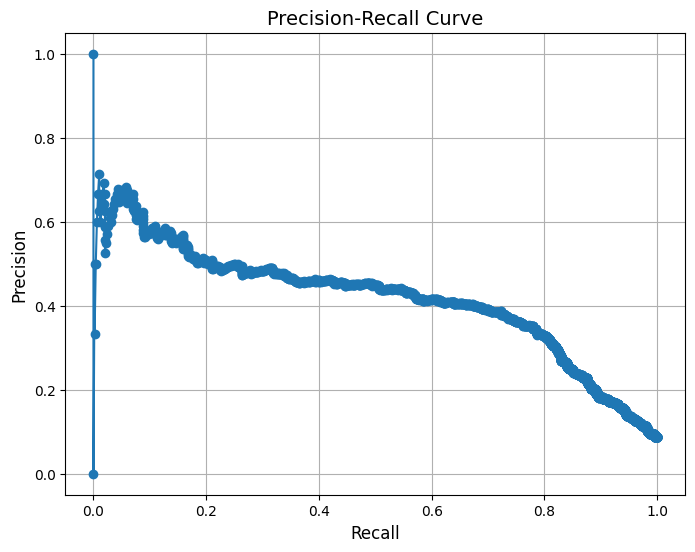

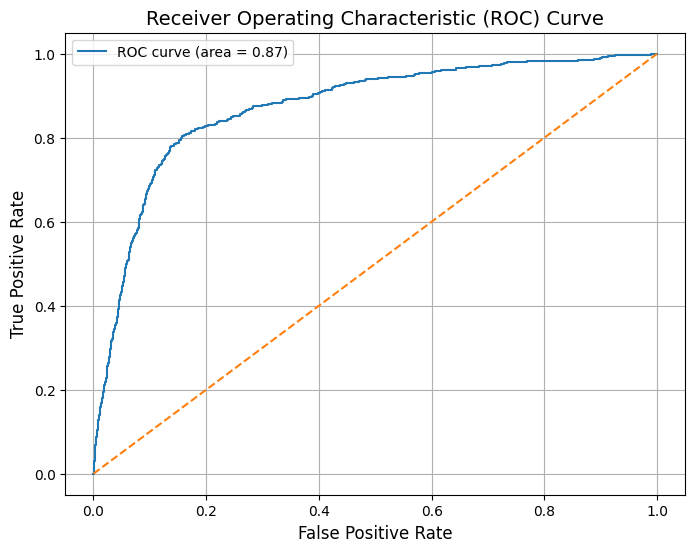

In [183]:
# Creating a pipeline with 
pipeline = Pipeline(steps=[
    ('scaler', scaler), 
    ('pca', pca_final),                 
    ('log_reg', logreg )  
])

# Define the parameter grid
param_dist = {
    'pca__n_components': np.arange(1, 21),  
    'log_reg__C': np.logspace(-4, 4, 10), 
    'log_reg__solver': ['liblinear', 'lbfgs'], 
}

# Initialize StratifiedKFold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Using RandomizedSearchCV for hyperparameter tuning
random_search = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=50,
                                   cv=cv, scoring='accuracy', n_jobs=-1, random_state=42)

# Fit the model
random_search.fit(X_train_smote, y_train_smote)

# Getting the best model from random search
best_model = random_search.best_estimator_

# Make predictions on the test data
y_pred_train = best_model.predict(X_train_smote)
y_pred_test = best_model.predict(X_test)

# Evaluate the model
print("\n Best Hyperparameters:", random_search.best_params_)

# Evaluate the model on the training set
print("\n-- Train Set Evaluation of Logistic Regression After PCA With Hyperparamter Tuning With StratifiedKFold cross-validation --")
evaluate_model(y_train_smote, y_pred_train)

# Evaluate the model on the test set
print("\n-- Test Set Evaluation of Logistic Regression After PCA With Hyperparamter Tuning With StratifiedKFold cross-validation --")
evaluate_model(y_test, y_pred_test)

# Get predicted probabilities for ROC and Precision-Recall curves
y_pred_proba_test = best_model.predict_proba(X_test)[:, 1]

# Plot Precision-Recall Curve
plot_precision_recall_curve(y_test, y_pred_proba_test)

# Plot ROC Curve
plot_roc_curve(y_test, y_pred_proba_test)

In [184]:
# Get PCA components and explained variance
pca = best_model.named_steps['pca']
pca_components = pca.components_
explained_variance = pca.explained_variance_ratio_

# Create a DataFrame to display PCA components and their importance
pca_importance_df = pd.DataFrame(data={
    'PCA Component': [f'PC{i+1}' for i in range(len(explained_variance))],
    'Explained Variance Ratio': explained_variance
})

# Sort by explained variance ratio
pca_importance_df = pca_importance_df.sort_values(by='Explained Variance Ratio', ascending=False)

# Display the PCA components and their importance
print("\nPCA Components and Importance:")
print(pca_importance_df)


PCA Components and Importance:
   PCA Component  Explained Variance Ratio
0            PC1                  0.105677
1            PC2                  0.076578
2            PC3                  0.060084
3            PC4                  0.056644
4            PC5                  0.038731
5            PC6                  0.036685
6            PC7                  0.030871
7            PC8                  0.024886
8            PC9                  0.022790
9           PC10                  0.021963
10          PC11                  0.019211
11          PC12                  0.018066
12          PC13                  0.017466
13          PC14                  0.015625
14          PC15                  0.014779
15          PC16                  0.013399
16          PC17                  0.013002
17          PC18                  0.011283
18          PC19                  0.011098


## Model Using Decision Tree


--- Training Set Evaluation of Decision Tree Model And Hyperparamter Tuning With StratifiedKFold cross-validation  ---
Accuracy: 0.9876138255164986
Precision: 0.9860433339839938
Recall: 0.9892294134926075
F1 Score: 0.9876338041937534

Confusion Matrix:
[[20140   286]
 [  220 20206]]

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99     20426
           1       0.99      0.99      0.99     20426

    accuracy                           0.99     40852
   macro avg       0.99      0.99      0.99     40852
weighted avg       0.99      0.99      0.99     40852


--- Test Set Evaluation of Decision Tree Model And Hyperparamter Tuning With StratifiedKFold cross-validation ---
Accuracy: 0.8843683083511777
Precision: 0.39470198675496687
Recall: 0.6094069529652352
F1 Score: 0.4790996784565916

Confusion Matrix:
[[4658  457]
 [ 191  298]]

Classification Report:
              precision    recall  f1-score   support

        

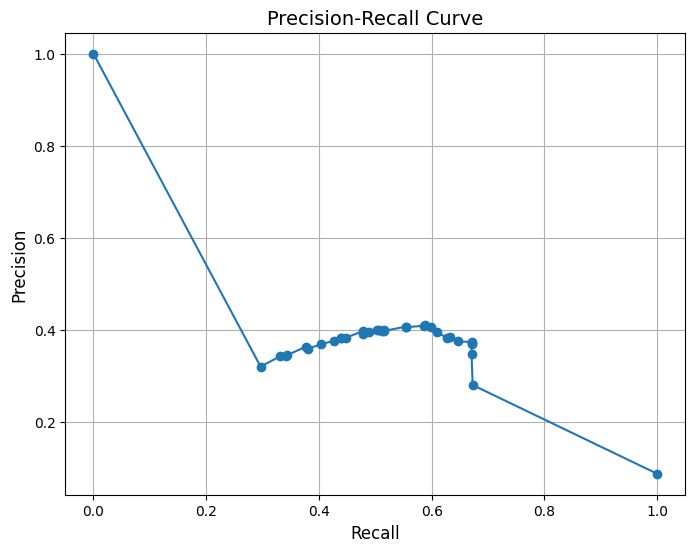

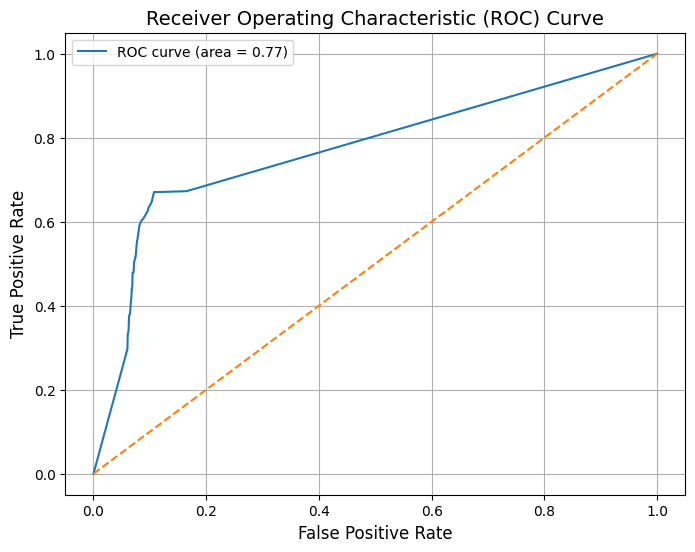

In [185]:
# Create the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=42)

# Creating a pipeline with StandardScaler and Decision Tree
pipeline_dt = Pipeline(steps=[
    ('scaler', scaler),
    ('dt', dt_model)
])

# Define the parameter grid for RandomizedSearchCV
param_dist_dt = {
    'dt__criterion': ['gini'],
    'dt__max_depth': [None, 5, 10, 15, 20],
    'dt__min_samples_split': [2, 5, 10],
    'dt__min_samples_leaf': [1, 2, 4],
    'dt__max_features': ['auto', 'sqrt', 'log2'],
}

# Initialize StratifiedKFold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Using RandomizedSearchCV for hyperparameter tuning
random_search_dt = RandomizedSearchCV(pipeline_dt, param_distributions=param_dist_dt, n_iter=50, cv=cv,
                                       scoring='accuracy', n_jobs=-1, random_state=42)

# Fit the model 
random_search_dt.fit(X_train_smote, y_train_smote)

# Getting the best model from random search
best_model_dt = random_search_dt.best_estimator_

# Making predictions
y_train_pred_dt = best_model_dt.predict(X_train_smote)
y_test_pred_dt = best_model_dt.predict(X_test)

# Evaluate the model on the training set
print("\n--- Training Set Evaluation of Decision Tree Model And Hyperparamter Tuning With StratifiedKFold cross-validation  ---")
evaluate_model(y_train_smote, y_train_pred_dt)

# Evaluate the model on the test set
print("\n--- Test Set Evaluation of Decision Tree Model And Hyperparamter Tuning With StratifiedKFold cross-validation ---")
evaluate_model(y_test, y_test_pred_dt)

# Get predicted probabilities for ROC and Precision-Recall curves
y_pred_proba_test_dt = best_model_dt.predict_proba(X_test)[:, 1]

# Plot Precision-Recall Curve
plot_precision_recall_curve(y_test, y_pred_proba_test_dt)

# Plot ROC Curve
plot_roc_curve(y_test, y_pred_proba_test_dt)

## Model using Random Forest


--- Training Set Evaluation of Random Forest Model And Hyperparamter Tuning With StratifiedKFold cross-validation  ---
Accuracy: 0.9999755213943013
Precision: 1.0
Recall: 0.9999510427886028
F1 Score: 0.9999755207950846

Confusion Matrix:
[[20426     0]
 [    1 20425]]

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00     20426
           1       1.00      1.00      1.00     20426

    accuracy                           1.00     40852
   macro avg       1.00      1.00      1.00     40852
weighted avg       1.00      1.00      1.00     40852


--- Test Set Evaluation of Random Forest Model And Hyperparamter Tuning With StratifiedKFold cross-validation ---
Accuracy: 0.936830835117773
Precision: 0.6261682242990654
Recall: 0.6850715746421268
F1 Score: 0.654296875

Confusion Matrix:
[[4915  200]
 [ 154  335]]

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.9

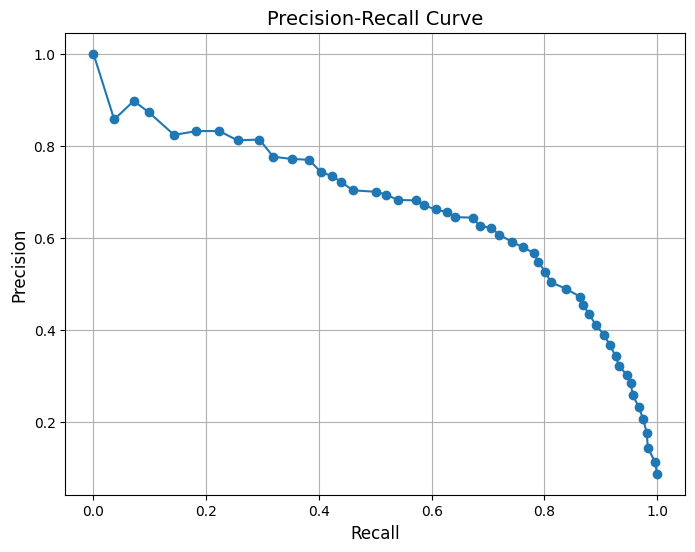

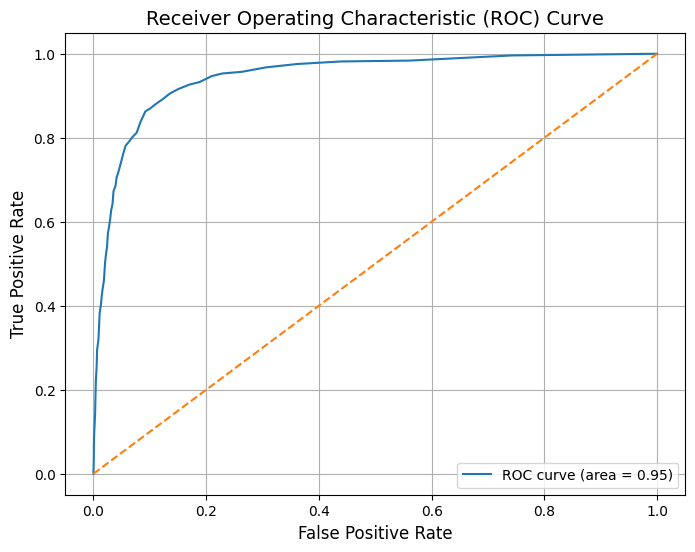

In [186]:
# Create the Random Forest model
rf_model = RandomForestClassifier(random_state=42)

# Creating a pipeline with StandardScaler and Random Forest
pipeline_rf = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('rf', rf_model)
])


# Define the parameter grid for RandomizedSearchCV
param_dist_rf = {
    'rf__n_estimators': [50], 
    'rf__max_depth': [None, 10, 20],
    'rf__min_samples_split': [2, 5],
    'rf__min_samples_leaf': [1, 2],
    'rf__max_features': ['sqrt'],
    'rf__bootstrap': [True],  
}
# Initialize StratifiedKFold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Using RandomizedSearchCV for hyperparameter tuning
random_search_rf = RandomizedSearchCV(pipeline_rf, param_distributions=param_dist_rf, n_iter=50, cv=cv,
                                       scoring='accuracy', n_jobs=-1, random_state=42)

# Fit the model
random_search_rf.fit(X_train_smote, y_train_smote)

# Getting the best model from random search
best_model_rf = random_search_rf.best_estimator_

# Making predictions
y_train_pred_rf = best_model_rf.predict(X_train_smote)
y_test_pred_rf = best_model_rf.predict(X_test)

# Evaluate the model on the training set
print("\n--- Training Set Evaluation of Random Forest Model And Hyperparamter Tuning With StratifiedKFold cross-validation  ---")
evaluate_model(y_train_smote, y_train_pred_rf)

# Evaluate the model on the test set
print("\n--- Test Set Evaluation of Random Forest Model And Hyperparamter Tuning With StratifiedKFold cross-validation ---")
evaluate_model(y_test, y_test_pred_rf)

# Get predicted probabilities for ROC and Precision-Recall curves
y_pred_proba_test_rf = best_model_rf.predict_proba(X_test)[:, 1]

# Plot Precision-Recall Curve
plot_precision_recall_curve(y_test, y_pred_proba_test_rf)

# Plot ROC Curve
plot_roc_curve(y_test, y_pred_proba_test_rf)

## Model using  Adaboost Classifier


--- Training Set Evaluation of Adaboost Classifer And Hyperparamter Tuning With StratifiedKFold cross-validation  ---
Accuracy: 0.9229168706550475
Precision: 0.9177022387698854
Recall: 0.9291589151081955
F1 Score: 0.9233950422069234

Confusion Matrix:
[[18724  1702]
 [ 1447 18979]]

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.92      0.92     20426
           1       0.92      0.93      0.92     20426

    accuracy                           0.92     40852
   macro avg       0.92      0.92      0.92     40852
weighted avg       0.92      0.92      0.92     40852


--- Test Set Evaluation of Adaboost Classifer And Hyperparamter Tuning With StratifiedKFold cross-validation ---
Accuracy: 0.900785153461813
Precision: 0.45929526123936815
Recall: 0.7730061349693251
F1 Score: 0.5762195121951219

Confusion Matrix:
[[4670  445]
 [ 111  378]]

Classification Report:
              precision    recall  f1-score   support

           

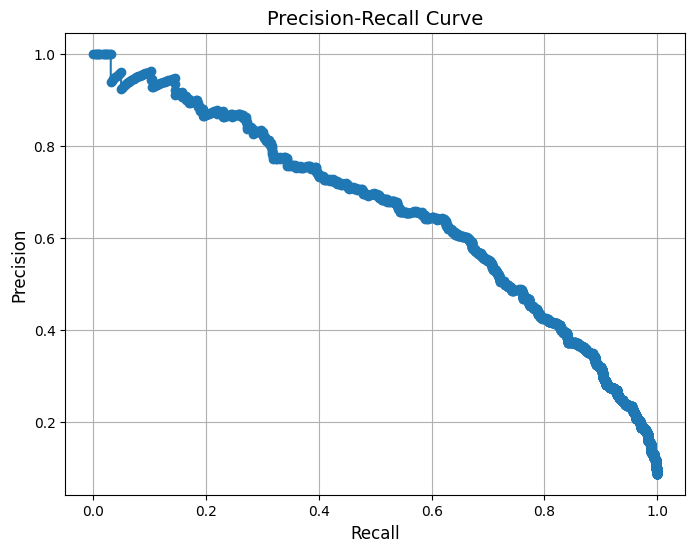

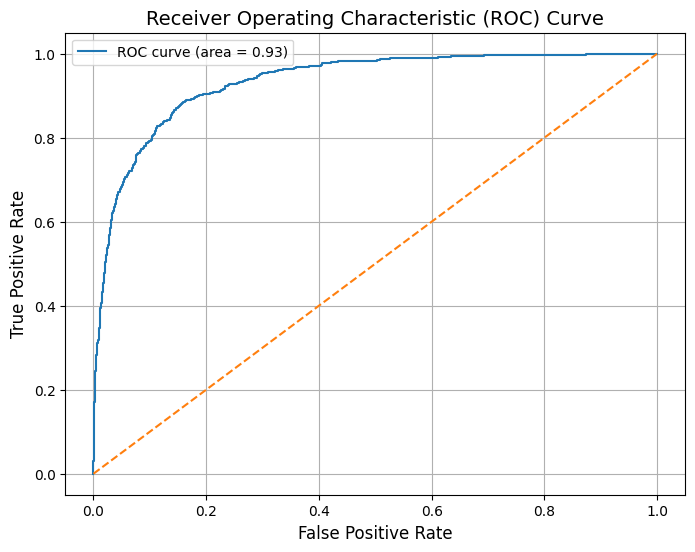

In [187]:
# Create the base model for AdaBoost (using DecisionTreeClassifier as the  estimator)
base_model = DecisionTreeClassifier(max_depth=1, random_state=42) 
ada_model = AdaBoostClassifier(estimator=base_model,algorithm='SAMME', random_state=42)

# Creating a pipeline
pipeline_ada = Pipeline(steps=[
    ('scaler', StandardScaler()),
    ('ada', ada_model)
])

# Define the parameter grid for RandomizedSearchCV
param_dist_ada = {
    'ada__n_estimators': [50, 100],  
    'ada__learning_rate': [0.01, 0.1],  
    'ada__estimator__max_depth': [1, 2]  
}

# Initialize StratifiedKFold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Using RandomizedSearchCV for hyperparameter tuning
random_search_ada = RandomizedSearchCV(pipeline_ada, param_distributions=param_dist_ada, n_iter=20, cv=cv,
                                        scoring='accuracy', n_jobs=-1, random_state=42)

# Fit the model 
random_search_ada.fit(X_train_smote, y_train_smote)

# Getting the best model from random search
best_model_ada = random_search_ada.best_estimator_

# Making predictions
y_train_pred_ada = best_model_ada.predict(X_train_smote)
y_test_pred_ada = best_model_ada.predict(X_test)

# Evaluate the model on the training set
print("\n--- Training Set Evaluation of Adaboost Classifer And Hyperparamter Tuning With StratifiedKFold cross-validation  ---")
evaluate_model(y_train_smote, y_train_pred_ada)

# Evaluate the model on the test set
print("\n--- Test Set Evaluation of Adaboost Classifer And Hyperparamter Tuning With StratifiedKFold cross-validation ---")
evaluate_model(y_test, y_test_pred_ada)

# Get predicted probabilities for ROC and Precision-Recall curves
y_pred_proba_test_ada = best_model_ada.predict_proba(X_test)[:, 1]

# Plot Precision-Recall Curve
plot_precision_recall_curve(y_test, y_pred_proba_test_ada)

# Plot ROC Curve
plot_roc_curve(y_test, y_pred_proba_test_ada)

## Model using Xgboost


--- Training Set Evaluation of XGBoost Classifer And Hyperparamter Tuning With StratifiedKFold cross-validation  ---
Accuracy: 0.9605621235779612
Precision: 0.8195488721804511
Recall: 0.7124183006535948
F1 Score: 0.7622377622377622

Confusion Matrix:
[[20114   312]
 [  572  1417]]

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.98      0.98     20426
           1       0.82      0.71      0.76      1989

    accuracy                           0.96     22415
   macro avg       0.90      0.85      0.87     22415
weighted avg       0.96      0.96      0.96     22415


--- Test Set Evaluation of XGBoost Classifer Hyperparamter Tuning With StratifiedKFold cross-validation ---
Accuracy: 0.9439685938615274
Precision: 0.7192982456140351
Recall: 0.5869120654396728
F1 Score: 0.6463963963963963

Confusion Matrix:
[[5003  112]
 [ 202  287]]

Classification Report:
              precision    recall  f1-score   support

           0     

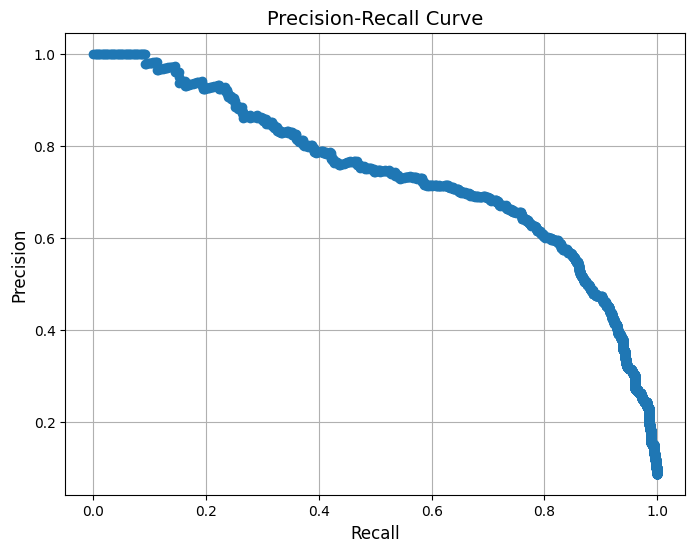

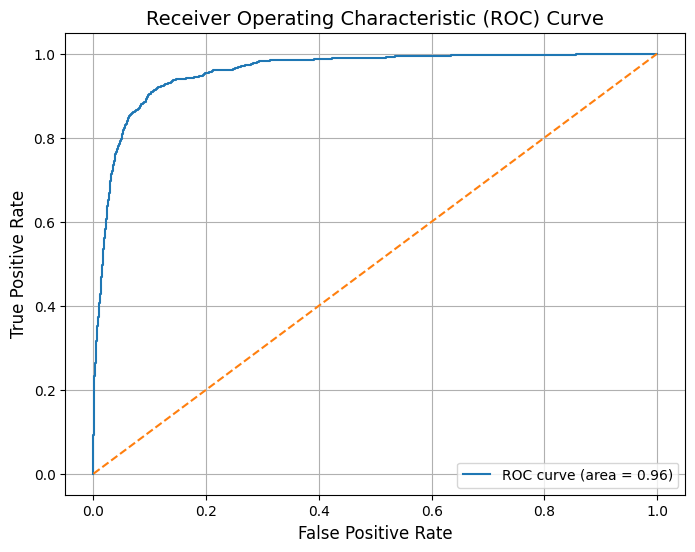

In [188]:
# Calculate imbalance ratio (majority to minority class)
imbalance_ratio = len(y_train[y_train == 0]) / len(y_train[y_train == 1])
imbalance_ratio

# Define a pipeline with StandardScaler and XGBoost
pipeline = Pipeline(steps=[
    ('scaler', StandardScaler()), 
    ('xgb',xgb.XGBClassifier(n_jobs=-1, objective='binary:logistic')
)
])

# Define parameter grid for XGBoost
param_dist = {
    'xgb__n_estimators': [100, 200, 300,500,700],
    'xgb__max_depth': [3, 5, 7],
    'xgb__learning_rate': [0.01, 0.05, 0.1, 0.2],
    'xgb__subsample': [0.6, 0.8, 1.0],
    'xgb__colsample_bytree': [0.6, 0.8, 1.0],
    'xgb__gamma': [0, 0.1, 0.5, 1],
    'xgb__reg_alpha': [0, 0.1, 1],
    'xgb__reg_lambda': [0, 0.1, 1],
    'xgb__min_child_weight': [1, 3, 5],
    'xgb__scale_pos_weight': [1, 5, imbalance_ratio, 15, 20, 30]
}

# Initialize StratifiedKFold cross-validation
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Randomized search for hyperparameter tuning
random_search_xgb = RandomizedSearchCV(pipeline, param_distributions=param_dist, n_iter=50,
                                   cv=cv, scoring='accuracy', n_jobs=-1, random_state=42)

# Fit RandomizedSearchCV to find the best hyperparameters
random_search_xgb.fit(X_train, y_train)

# Now that the random search is done, get the best model
best_model_xgb = random_search_xgb.best_estimator_
# Making predictions
y_train_pred_xgb = best_model_xgb.predict(X_train)
y_test_pred_xgb = best_model_xgb.predict(X_test)

# Evaluate the model on the training set
print("\n--- Training Set Evaluation of XGBoost Classifer And Hyperparamter Tuning With StratifiedKFold cross-validation  ---")
evaluate_model(y_train, y_train_pred_xgb)

# Evaluate the model on the test set
print("\n--- Test Set Evaluation of XGBoost Classifer Hyperparamter Tuning With StratifiedKFold cross-validation ---")
evaluate_model(y_test, y_test_pred_xgb)

# Get predicted probabilities for ROC and Precision-Recall curves
y_pred_proba_test_xgb= best_model_xgb.predict_proba(X_test)[:, 1]

# Plot Precision-Recall Curve
plot_precision_recall_curve(y_test, y_pred_proba_test_xgb)

# Plot ROC Curve
plot_roc_curve(y_test, y_pred_proba_test_xgb)


Top 15 Important Features:
                 Feature  Importance
80        total_ic_mou_8    0.127556
53        total_og_mou_8    0.104293
2                 arpu_8    0.036477
14         roam_og_mou_8    0.021430
95      total_rech_amt_8    0.018570
101   last_day_rch_amt_8    0.018457
107      max_rech_data_8    0.014291
11         roam_ic_mou_8    0.013577
119          vol_2g_mb_8    0.012239
179  total_rech_amt_diff    0.012050
116   av_rech_amt_data_8    0.011525
59      loc_ic_t2m_mou_8    0.010273
10         roam_ic_mou_7    0.010061
165    total_og_mou_diff    0.009801
40          std_og_mou_7    0.009725


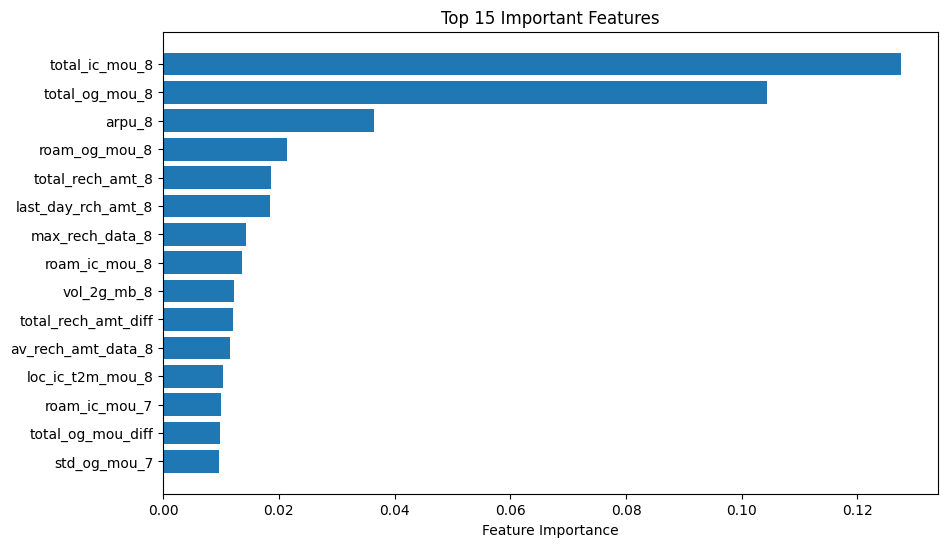

In [189]:
# Extracting feature names 
feature_names = X_train.columns

# Getting feature importances from the XGBoost model
xgb_model = best_model_xgb.named_steps['xgb']  
feature_importances = xgb_model.feature_importances_

# Creating a DataFrame for feature importance
feature_importance_df = pd.DataFrame({
    'Feature': feature_names,
    'Importance': feature_importances
})

# Sortting by importance and get top 15 features
top_15_features = feature_importance_df.sort_values(by='Importance', ascending=False).head(15)

# Displaying top 15 features
print("\nTop 15 Important Features:")
print(top_15_features)

# Plotting the top 15 features
plt.figure(figsize=(10, 6))
plt.barh(top_15_features['Feature'], top_15_features['Importance'])
plt.gca().invert_yaxis()
plt.title('Top 15 Important Features')
plt.xlabel('Feature Importance')
plt.show()

**Observation**
-  XGBoost model has the best in terms of test set performance. 
        Accuracy: 0.9439 (highest)
        Precision: 0.7192 (best balance between precision and recall)
        Recall: 0.5869
        F1 Score: 0.6463

-  Random Forest also shows strong performance with an accuracy of 0.937.
-  AdaBoost and Decision Tree both provide decent performance but are outperformed by ensemble methods like Random Forest and XGBoost.
-  Logistic Regression models have the lowest performance metrics.

# 11. Create `submission.csv` file for final submission on Kaggle

In [190]:
# Defining submission Data from test set
submission_data = test.set_index('id')
submission_data.shape

# Predictions on the unseen test data using the best model pipeline
test['churn_probability'] = best_model_xgb.predict(submission_data)

# Creating the final output with 'id' and 'churn_probability'
output = test[['id', 'churn_probability']]

# Saving the submission file for Kaggle
output.to_csv('/kaggle/working/submission_final.csv', index=False)

# Checking the first few rows of the output to verify
output.head()

,id,churn_probability
0,69999,0
1,70000,0
2,70001,1
3,70002,0
4,70003,0


# 12. Recommendations

Recommendations to help reduce churn among users based on top features from XGBoost Model:

-  Offer attractive roaming packages or incentives for customers who travel frequently. Improving their experience while roaming can keep them loyal.
-  Create loyalty programs or bonuses for customers who reach certain recharge amounts, encouraging them to recharge more often.
-  Keep a close eye on customer engagement. If a customer’s incoming call usage drops, reach out to them with special offers to get them re-engaged.
-  Combine data with voice plans or provide promotions specifically for data usage to help retain customers.
-  Remind customers regularly about the benefits of recharging early, using push notifications or SMS reminders.
-  If a customer's usage declines, offer targeted promotions to encourage them to use services more often.

# 13. Conclusions

-  After evaluating several models the XGBoost is the best model based on the test performance, as it balances precision and recall well and has the highest accuracy and F1 score. This makes it the most reliable option. 

-  In the telecom churn reducing the churn rate is critical, sensitivity is the most relevant metric. 